In [1]:
# ============================================================
# LOAD ORIGINAL / OLDEST DATASET
# ============================================================

import numpy as np
import pandas as pd
from scipy import sparse
import spatialcorr

DATASET_ID = "GSM4284326_P10_ST_rep2"

adata_raw = spatialcorr.load_dataset(DATASET_ID)
adata_raw.var_names_make_unique()

# Make coordinate columns consistent with newer notebooks
if "row" not in adata_raw.obs.columns or "col" not in adata_raw.obs.columns:
    if {"array_row", "array_col"}.issubset(adata_raw.obs.columns):
        adata_raw.obs["row"] = adata_raw.obs["array_row"].astype(float)
        adata_raw.obs["col"] = adata_raw.obs["array_col"].astype(float)
    else:
        raise ValueError("Could not find row/col or array_row/array_col coordinates.")

adata_raw.obs["row"] = adata_raw.obs["row"].astype(float)
adata_raw.obs["col"] = adata_raw.obs["col"].astype(float)
adata_raw.obs["spot_id"] = adata_raw.obs_names.astype(str)

print(adata_raw)
print("spots:", adata_raw.n_obs)
print("genes:", adata_raw.n_vars)
print("obs columns:", list(adata_raw.obs.columns))

GENES_45 = [
    "KRT1","KRT10","KRT13","KRT14","KRT15","KRT16","KRT17","KRT18","KRT19","KRT2",
    "KRT20","KRT222","KRT23","KRT24","KRT25","KRT26","KRT3","KRT31","KRT32","KRT34",
    "KRT38","KRT4","KRT5","KRT6A","KRT6B","KRT6C","KRT7","KRT72","KRT73","KRT74",
    "KRT75","KRT76","KRT77","KRT78","KRT79","KRT8","KRT80","KRT82","KRT86",
    "KRTAP5.11","KRTAP5.8","KRTAP5.9","KRTCAP2","KRTCAP3","KRTDAP"
]

C:\Users\mcjia\miniconda3\envs\python311\Lib\site-packages\spatialcorr\load_data.py:7: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pr


AnnData object with n_obs × n_vars = 621 × 16642
    obs: 'row', 'col', 'cluster', 'spot_id'
spots: 621
genes: 16642
obs columns: ['row', 'col', 'cluster', 'spot_id']


In [2]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from scipy import sparse
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import scanpy as sc
import spatialcorr
try:
    from pyriemann.geometry.base import logm, nearest_sym_pos_def
except ImportError:
    from pyriemann.utils.base import logm, nearest_sym_pos_def

MELANOMA_SAMPLE = "ST_mel1_rep2"
N_CLUSTERS = 10
N_NEIGHBORS=15#should be 15
RIDGE=1e-6
TARGET_PRESERVED=0.90
LAMBDA_FOR_RANKING=0.5
LR=0.5
N_ITER=5000
N_PCS=20
# N_CLUSTERS=7
RANDOM_STATE=0
np.random.seed(RANDOM_STATE)


def dense(adata):
    X=adata.X.toarray() if sparse.issparse(adata.X) else np.asarray(adata.X)
    X=X.astype(float); X[~np.isfinite(X)]=0.0
    return X

def subset_genes(adata,genes):
    present=[g for g in genes if g in adata.var_names]
    missing=[g for g in genes if g not in adata.var_names]
    ad=adata[:,present].copy(); X=dense(ad); names=np.array(present)
    print("Requested:",len(genes),"Present:",len(present),"Missing:",len(missing),"Shape:",ad.shape)
    if missing: print("Missing:",missing)
    return ad,X,names

def coords_from(adata): return adata.obs[["row","col"]].to_numpy()

def neighbor_idx(adata,n_neighbors=N_NEIGHBORS):
    coords=coords_from(adata)
    nn=NearestNeighbors(n_neighbors=n_neighbors,metric="euclidean").fit(coords)
    return nn.kneighbors(return_distance=False)

def local_cov(X,nbr_idx,ridge=0.0):
    n,p=X.shape; out=np.empty((n,p,p),dtype=float); I=np.eye(p)
    for i in range(n):
        Z=X[nbr_idx[i],:]-X[nbr_idx[i],:].mean(axis=0,keepdims=True)
        C=(Z.T@Z)/max(len(nbr_idx[i])-1,1)+ridge*I
        out[i]=0.5*(C+C.T)
    return out

def local_corr(X,nbr_idx,eps=1e-12):
    C_mats=local_cov(X,nbr_idx,ridge=0.0)
    R=np.empty_like(C_mats)
    for i,C in enumerate(C_mats):
        sd=np.sqrt(np.maximum(np.diag(C),eps))
        M=C/np.outer(sd,sd)
        M=np.clip(M,-1,1); np.fill_diagonal(M,1.0)
        R[i]=0.5*(M+M.T)
    return R

def force_spd(mats, reg=RIDGE):
    mats = np.asarray(mats, dtype=float)
    mats = 0.5 * (mats + np.swapaxes(mats, -1, -2))
    I = np.eye(mats.shape[-1])
    mats = (1 - reg) * mats + reg * I
    try:
        return nearest_sym_pos_def(mats, reg=reg)
    except Exception:
        return np.stack([nearest_sym_pos_def(M, reg=reg) for M in mats])

def logeuclid_mats(mats, reg=RIDGE):
    return logm(force_spd(mats, reg=reg))

def logeuclid_features(log_mats):
    p = log_mats.shape[1]
    i, j = np.triu_indices(p)
    F = log_mats[:, i, j].copy()
    F[:, i != j] *= np.sqrt(2.0)
    return F

def assoc_variation(mats):
    A=mats-mats.mean(axis=0,keepdims=True)
    S=np.sum(A**2,axis=0)
    return 0.5*(S+S.T)

def kept_fraction(S_norm,w): return np.sum(S_norm*np.outer(w**2,w**2))

def optimize_weights(S_norm,lam=LAMBDA_FOR_RANKING,lr=LR,n_iter=N_ITER):
    p=S_norm.shape[0]; w=np.ones(p)
    for _ in range(n_iter):
        grad=4*w*(S_norm@(w**2)); w=w+lr*grad
        w=np.maximum(0,w-lr*lam/p); w=np.clip(w,0,1)
    return w

def preservation_path(S_norm,order,gene_names):
    rows=[]
    for k in range(1,len(gene_names)+1):
        ww=np.zeros(len(gene_names)); ww[order[:k]]=1.0
        rows.append({"k":k,"preserved_fraction":kept_fraction(S_norm,ww),"genes":", ".join(gene_names[order[:k]])})
    return pd.DataFrame(rows)

def corr_features(corr_mats):
    p=corr_mats.shape[1]
    i,j=np.triu_indices(p,k=1)
    return corr_mats[:,i,j].copy()

def relabel_by_position(raw,coords):
    cent=pd.DataFrame({"raw":raw,"row":coords[:,0],"col":coords[:,1]}).groupby("raw")[["row","col"]].mean()
    mapping={old:i+1 for i,old in enumerate(cent.sort_values(["row","col"]).index)}
    return np.array([mapping[x] for x in raw])

def run_variant(mode,prefix):
    nbr_idx=neighbor_idx(adata_g,N_NEIGHBORS)
    mats=local_corr(X,nbr_idx) if mode=="corr" else local_cov(X,nbr_idx,ridge=0.0)

    metric_mats = logeuclid_mats(mats, reg=RIDGE)
    S_raw = assoc_variation(metric_mats)
    S_norm=S_raw/S_raw.sum()
    weights=optimize_weights(S_norm)
    order=np.argsort(weights)[::-1]
    path=preservation_path(S_norm,order,gene_names)

    candidates=path[path["preserved_fraction"]>=TARGET_PRESERVED]
    chosen=candidates.iloc[0] if len(candidates) else path.iloc[-1]

    k_selected=int(chosen["k"])
    selected_idx=order[:k_selected]
    selected_genes=list(gene_names[selected_idx])

    ad=adata[:,selected_genes].copy()
    X_sel=dense(ad)
    coords_sel=coords_from(ad)
    nbr_sel=neighbor_idx(ad,N_NEIGHBORS)

    final_mats = local_corr(X_sel,nbr_sel) if mode=="corr" else local_cov(X_sel,nbr_sel,ridge=RIDGE)
    final_metric_mats = logeuclid_mats(final_mats, reg=RIDGE)
    F = logeuclid_features(final_metric_mats)
    Z=StandardScaler().fit_transform(F)

    n_components=min(N_PCS,Z.shape[0]-1,Z.shape[1])
    scores=PCA(n_components=n_components,random_state=RANDOM_STATE).fit_transform(Z)

    raw=KMeans(n_clusters=N_CLUSTERS,n_init=50,random_state=RANDOM_STATE).fit_predict(scores)
    clusters=relabel_by_position(raw,coords_sel)

    ad.obs[f"{prefix}_cluster"]=clusters.astype(int)
    ad.obs[f"{prefix}_PC1"]=scores[:,0]
    ad.obs[f"{prefix}_PC2"]=scores[:,1] if scores.shape[1]>1 else 0

    summary=pd.DataFrame([{
        "mode":mode,
        "target":TARGET_PRESERVED,
        "selected_genes":k_selected,
        "preserved_fraction":float(chosen["preserved_fraction"]),
        "genes":", ".join(selected_genes)
    }])

    return {
        "adata": ad,
        "path": path,
        "summary": summary,
        "selected_genes": selected_genes,
        "prefix": prefix,
        "embedding": scores
    }

In [3]:
adata = adata_raw.copy()

adata_g, X, gene_names = subset_genes(adata, GENES_45)

old_corr_only = run_variant(
    mode="corr",
    prefix="Old_CorrOnly"
)

display(old_corr_only["summary"])

Requested: 45 Present: 45 Missing: 0 Shape: (621, 45)


,mode,target,selected_genes,preserved_fraction,genes
0,corr,0.9,29,0.967443,"KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, KR..."


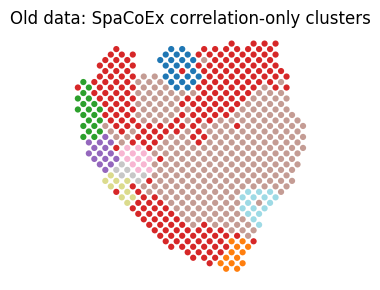

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

ad_plot = old_corr_only["adata"].copy()
cluster_col = "Old_CorrOnly_cluster"

coords = coords_from(ad_plot)
labels = ad_plot.obs[cluster_col].astype(str)
codes = pd.Categorical(labels).codes

plt.figure(figsize=(4, 3))
plt.scatter(
    coords[:, 1],
    coords[:, 0],
    c=codes,
    cmap="tab20",
    s=20,
    linewidths=0
)

plt.gca().invert_yaxis()
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("Old data: SpaCoEx correlation-only clusters")
plt.tight_layout()
plt.show()

In [5]:
adata_g

AnnData object with n_obs × n_vars = 621 × 45
    obs: 'row', 'col', 'cluster', 'spot_id'

,lambda,log10_lambda,gene,weight
0,0.0001,-4.0,KRT1,1.0
1,0.0001,-4.0,KRT10,1.0
2,0.0001,-4.0,KRT13,1.0
3,0.0001,-4.0,KRT14,1.0
4,0.0001,-4.0,KRT15,1.0


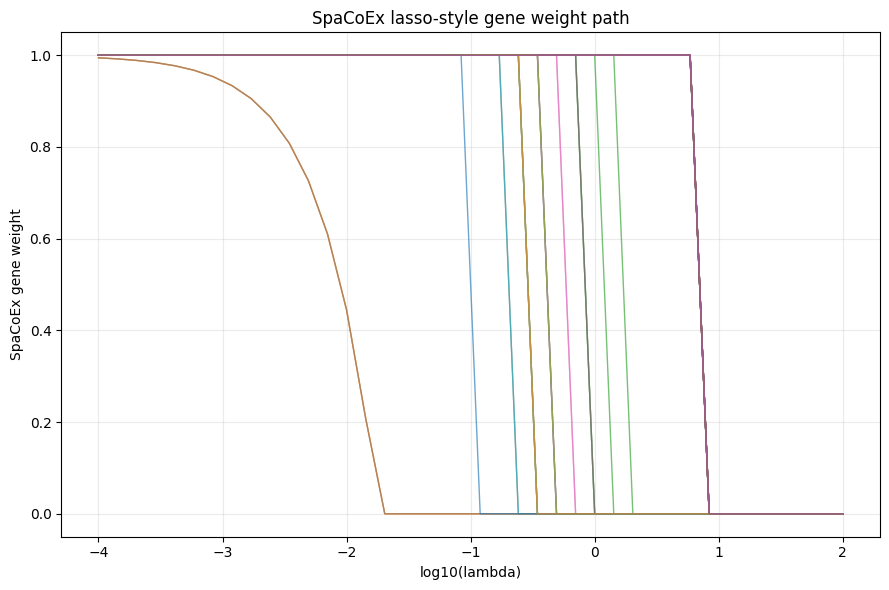

,lambda,n_active_genes,log10_lambda
0,0.000100,45,-4.000000
1,0.000143,45,-3.846154
2,0.000203,45,-3.692308
3,0.000289,45,-3.538462
4,0.000412,45,-3.384615
5,0.000588,45,-3.230769
6,0.000838,45,-3.076923
7,0.001194,45,-2.923077
8,0.001701,45,-2.769231
9,0.002424,45,-2.615385


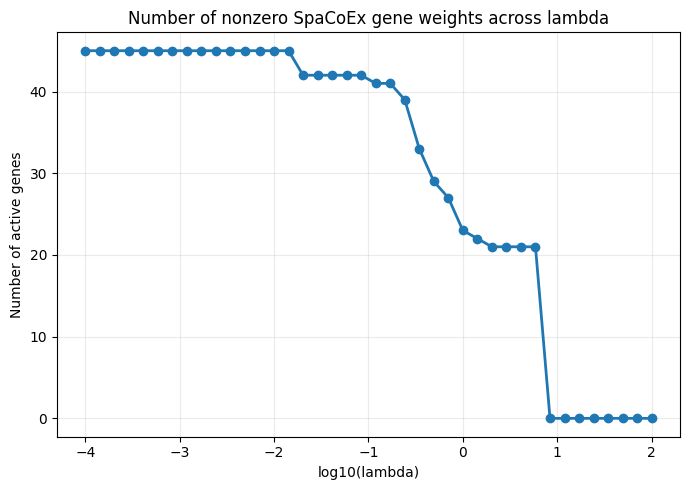

In [6]:
# ============================================================
# SpaCoEx LASSO-PATH-ISH PLOT:
# GENE WEIGHTS ACROSS LAMBDA VALUES
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. Recompute SpaCoEx association matrix once
# ------------------------------------------------------------

nbr_idx = neighbor_idx(adata_g, N_NEIGHBORS)

# correlation version
mats = local_corr(X, nbr_idx)

metric_mats = logeuclid_mats(mats, reg=RIDGE)
S_raw = assoc_variation(metric_mats)
S_norm = S_raw / S_raw.sum()

gene_names_array = np.asarray(gene_names).astype(str)

# ------------------------------------------------------------
# 2. Run weight optimization across lambda values
# ------------------------------------------------------------

lambda_values = np.logspace(-4, 2, 40)

weight_rows = []

for lam in lambda_values:
    w = optimize_weights(
        S_norm,
        lam=float(lam),
        lr=LR,
        n_iter=N_ITER
    )

    for gene, weight in zip(gene_names_array, w):
        weight_rows.append({
            "lambda": float(lam),
            "log10_lambda": np.log10(lam),
            "gene": gene,
            "weight": float(weight)
        })

weight_path_df = pd.DataFrame(weight_rows)

display(weight_path_df.head())

# ------------------------------------------------------------
# 3. Plot all gene weight paths
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(9, 6))

for gene in gene_names_array:
    sub = weight_path_df[weight_path_df["gene"] == gene]
    ax.plot(
        sub["log10_lambda"],
        sub["weight"],
        linewidth=1,
        alpha=0.65
    )

ax.set_xlabel("log10(lambda)")
ax.set_ylabel("SpaCoEx gene weight")
ax.set_title("SpaCoEx lasso-style gene weight path")
ax.grid(alpha=0.25)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 5. Number of active genes across lambda
# ------------------------------------------------------------

active_gene_df = (
    weight_path_df
    .assign(active=lambda d: d["weight"] > 1e-6)
    .groupby("lambda")["active"]
    .sum()
    .reset_index()
    .rename(columns={"active": "n_active_genes"})
)

active_gene_df["log10_lambda"] = np.log10(active_gene_df["lambda"])

display(active_gene_df)

fig, ax = plt.subplots(figsize=(7, 5))

ax.plot(
    active_gene_df["log10_lambda"],
    active_gene_df["n_active_genes"],
    marker="o",
    linewidth=2
)

ax.set_xlabel("log10(lambda)")
ax.set_ylabel("Number of active genes")
ax.set_title("Number of nonzero SpaCoEx gene weights across lambda")
ax.grid(alpha=0.25)

plt.tight_layout()
plt.show()

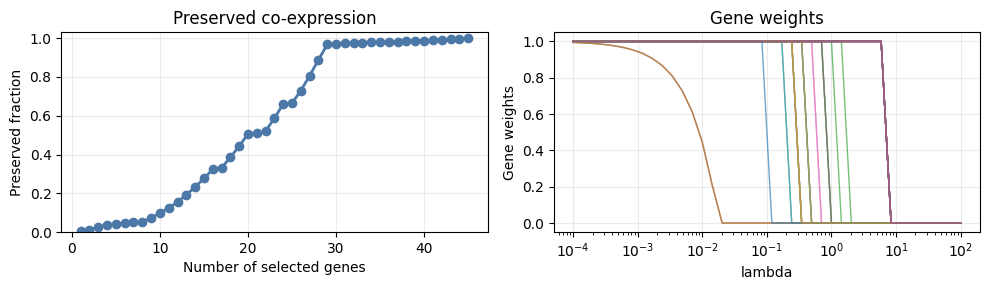

In [7]:
# ============================================================
# SpaCoEx: Preserved Fraction + Lasso-Style Gene Weight Path
# Left: preserved fraction vs number of selected genes
# Right: gene weights across lambda values
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "old_corr_only" in globals():
    result = old_corr_only
elif "breast_corr_only" in globals():
    result = breast_corr_only
else:
    raise ValueError("Could not find old_corr_only or breast_corr_only. Run SpaCoEx first.")

path = result["path"].copy()

nbr_idx = neighbor_idx(adata_g, N_NEIGHBORS)

mats = local_corr(X, nbr_idx)
metric_mats = logeuclid_mats(mats, reg=RIDGE)

S_raw = assoc_variation(metric_mats)
S_norm = S_raw / S_raw.sum()

gene_names_array = np.asarray(gene_names).astype(str)

lambda_values = np.logspace(-4, 2, 40)

weight_rows = []

for lam in lambda_values:
    w = optimize_weights(
        S_norm,
        lam=float(lam),
        lr=LR,
        n_iter=N_ITER
    )

    for gene, weight in zip(gene_names_array, w):
        weight_rows.append({
            "lambda": float(lam),
            "log10_lambda": np.log10(lam),
            "gene": gene,
            "weight": float(weight)
        })

weight_path_df = pd.DataFrame(weight_rows)

fig, axes = plt.subplots(1, 2, figsize=(10, 3))

# Left: preserved fraction path
axes[0].plot(
    path["k"],
    path["preserved_fraction"],
    marker="o",
    linewidth=2,
    color="#4C78A8"
)

axes[0].set_xlabel("Number of selected genes")
axes[0].set_ylabel("Preserved fraction")
axes[0].set_title("Preserved co-expression")
axes[0].set_ylim(0, 1.03)
axes[0].grid(alpha=0.25)

# Right: lasso-style weight path
# Right: lasso-style weight path
for gene in gene_names_array:
    sub = weight_path_df[weight_path_df["gene"] == gene]

    axes[1].plot(
        sub["lambda"],
        sub["weight"],
        linewidth=1,
        alpha=0.65
    )

axes[1].set_xscale("log")
axes[1].set_xlabel("lambda")
axes[1].set_ylabel("Gene weights")
axes[1].set_title("Gene weights")
axes[1].grid(alpha=0.25)

plt.tight_layout()
plt.show()

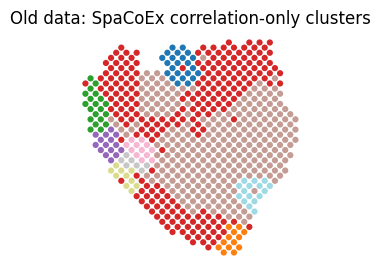

In [8]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

ad_plot = old_corr_only["adata"].copy()
cluster_col = "Old_CorrOnly_cluster"

coords = coords_from(ad_plot)
labels = ad_plot.obs[cluster_col].astype(str)
codes = pd.Categorical(labels).codes

plt.figure(figsize=(4, 3))
plt.scatter(
    coords[:, 1],
    coords[:, 0],
    c=codes,
    cmap="tab20",
    s=20,
    linewidths=0
)

plt.gca().invert_yaxis()
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("Old data: SpaCoEx correlation-only clusters")
plt.show()

Requested: 45 Present: 45 Missing: 0 Shape: (621, 45)


,rank,gene
0,1,KRTDAP
1,2,KRT2
2,3,KRT6A
3,4,KRTCAP3
4,5,KRT34
5,6,KRT32
6,7,KRT31
7,8,KRT3
8,9,KRT23
9,10,KRT19


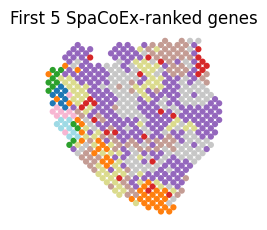

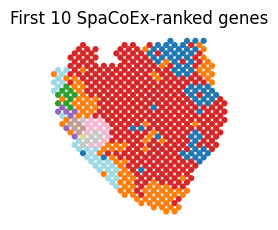

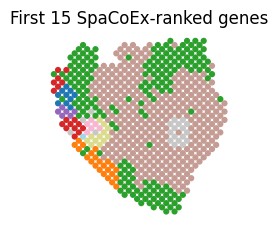

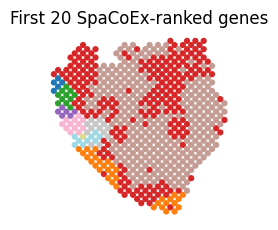

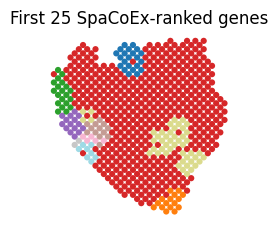

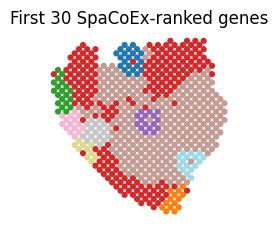

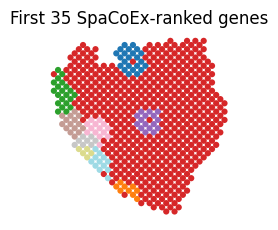

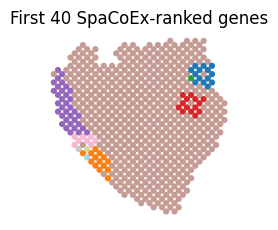

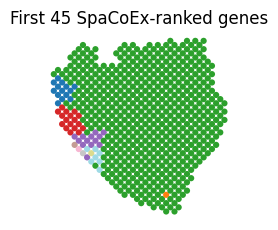

,k,genes_used,total_expression_captured_fraction,total_expression_captured_percent,mean_percent_spots_expressed,n_clusters
0,5,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34]",0.199087,19.908719,66.859903,10
1,10,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K...",0.199766,19.976580,45.893720,10
2,15,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K...",0.435851,43.585139,59.613527,10
3,20,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K...",0.869954,86.995444,64.742351,10
4,25,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K...",0.872062,87.206204,57.655395,10
5,30,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K...",0.999941,99.994111,57.289318,10
6,35,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K...",0.999951,99.995121,49.123533,10
7,40,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K...",0.999986,99.998623,42.995169,10
8,45,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K...",1.000000,100.000000,38.235820,10


,k,total_expression_captured_percent,mean_percent_spots_expressed,n_clusters,spatial_neighbor_agreement,silhouette,ARI_vs_BayesSpace,NMI_vs_BayesSpace,genes_used
0,5,19.908719,66.859903,10,0.443693,0.155763,0.113513,0.189439,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34]"
1,10,19.976580,45.893720,10,0.676651,0.222620,0.126661,0.258227,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K..."
2,15,43.585139,59.613527,10,0.737627,0.139737,0.115120,0.245747,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K..."
3,20,86.995444,64.742351,10,0.690714,0.112574,0.115009,0.234246,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K..."
4,25,87.206204,57.655395,10,0.831025,0.443611,0.069698,0.250405,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K..."
5,30,99.994111,57.289318,10,0.746967,0.188808,0.135045,0.293870,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K..."
6,35,99.995121,49.123533,10,0.857005,0.531552,0.076888,0.257458,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K..."
7,40,99.998623,42.995169,10,0.891143,0.547973,0.043133,0.186029,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K..."
8,45,100.000000,38.235820,10,0.927536,0.633973,0.042018,0.144325,"[KRTDAP, KRT2, KRT6A, KRTCAP3, KRT34, KRT32, K..."


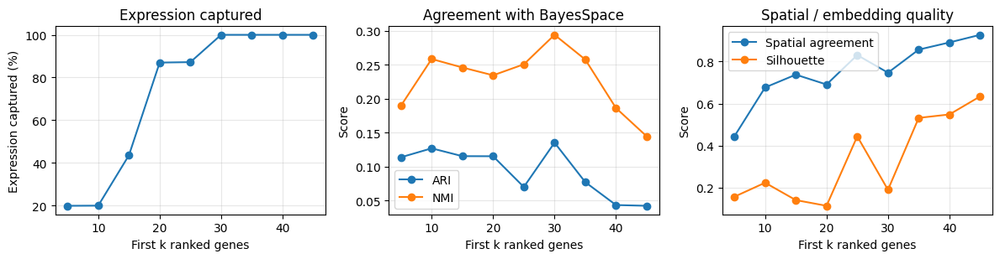

In [9]:
# ============================================================
# Rank all 45 genes once, then define firstXrankedgenes(k)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# ------------------------------------------------------------
# 1. Rank all 45 genes once using SpaCoEx
# ------------------------------------------------------------

adata_g, X, gene_names = subset_genes(adata, GENES_45)

full45_result = run_variant(
    mode="corr",
    prefix="Old_CorrOnly_full45"
)

ranked_genes_45 = (
    full45_result["path"]
    .iloc[-1]["genes"]
    .split(", ")
)

ranked_genes_45 = [g for g in ranked_genes_45 if g in adata.var_names]

ranked_gene_table = pd.DataFrame({
    "rank": np.arange(1, len(ranked_genes_45) + 1),
    "gene": ranked_genes_45
})

display(ranked_gene_table)

# Precompute total expression across all 45 ranked genes
ad_all_ranked = adata[:, ranked_genes_45].copy()
X_all_ranked = dense(ad_all_ranked)

total_expression_all_45 = X_all_ranked.sum()
gene_to_idx = {g: i for i, g in enumerate(ranked_genes_45)}

# ------------------------------------------------------------
# 2. Function: use first k ranked genes directly, no reselection
# ------------------------------------------------------------

def firstXrankedgenes(k, point_size=20, show_plot=True):
    genes_k = ranked_genes_45[:k]

    ad_k = adata[:, genes_k].copy()
    X_k = dense(ad_k)

    coords_k = coords_from(ad_k)
    nbr_k = neighbor_idx(ad_k, N_NEIGHBORS)

    # Local correlation + log-Euclidean features
    R_k = local_corr(X_k, nbr_k)
    metric_k = logeuclid_mats(R_k, reg=RIDGE)
    F_k = logeuclid_features(metric_k)

    Z_k = StandardScaler().fit_transform(F_k)

    n_components = min(N_PCS, Z_k.shape[0] - 1, Z_k.shape[1])

    scores_k = PCA(
        n_components=n_components,
        random_state=RANDOM_STATE
    ).fit_transform(Z_k)

    raw_k = KMeans(
        n_clusters=N_CLUSTERS,
        n_init=50,
        random_state=RANDOM_STATE
    ).fit_predict(scores_k)

    clusters_k = relabel_by_position(raw_k, coords_k).astype(str)

    # Expression captured
    idx_k = [gene_to_idx[g] for g in genes_k]
    X_k_from_all = X_all_ranked[:, idx_k]

    expression_captured = X_k_from_all.sum() / total_expression_all_45
    mean_percent_spots_expressed = (X_k_from_all > 0).mean(axis=0).mean() * 100

    summary = {
        "k": k,
        "genes_used": genes_k,
        "total_expression_captured_fraction": expression_captured,
        "total_expression_captured_percent": expression_captured * 100,
        "mean_percent_spots_expressed": mean_percent_spots_expressed,
        "n_clusters": len(pd.unique(clusters_k))
    }

    if show_plot:
        codes = pd.Categorical(clusters_k).codes

        plt.figure(figsize=(3, 2.4))
        plt.scatter(
            coords_k[:, 1],
            coords_k[:, 0],
            c=codes,
            cmap="tab20",
            s=point_size,
            linewidths=0
        )

        plt.gca().invert_yaxis()
        plt.gca().set_aspect("equal")
        plt.axis("off")
        plt.title(f"First {k} SpaCoEx-ranked genes")
        plt.tight_layout()
        plt.show()

    return {
        "summary": summary,
        "genes": genes_k,
        "adata": ad_k,
        "embedding": scores_k,
        "clusters": clusters_k
    }

# ------------------------------------------------------------
# 3. Simple loop
# ------------------------------------------------------------

all_results = {}
summary_rows = []

for k in range(5, 46, 5):
    result_k = firstXrankedgenes(k, show_plot=True)

    all_results[k] = result_k
    summary_rows.append(result_k["summary"])

summary_by_k = pd.DataFrame(summary_rows)

display(summary_by_k)

# ============================================================
# Compare first k SpaCoEx-ranked genes against BayesSpace
# Also report expression captured
# ============================================================

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score

BAYES_COL = "cluster"   # SpatialCorr-provided BayesSpace annotation

bayes_labels = adata.obs.loc[adata[:, ranked_genes_45].obs_names, BAYES_COL].astype(str).to_numpy()

def spatial_neighbor_agreement(labels, nbr_idx):
    labels = np.asarray(labels).astype(str)

    agree = 0
    total = 0

    for i, ids in enumerate(nbr_idx):
        ids = np.asarray(ids)
        ids = ids[ids != i]

        agree += np.sum(labels[ids] == labels[i])
        total += len(ids)

    return agree / total


def safe_silhouette(embedding, labels):
    labels = np.asarray(labels).astype(str)

    if embedding is None:
        return np.nan

    if len(pd.unique(labels)) < 2:
        return np.nan

    if len(pd.unique(labels)) >= len(labels):
        return np.nan

    return silhouette_score(embedding, labels)


def compare_firstXrankedgenes(k, show_plot=False):
    result_k = firstXrankedgenes(k, show_plot=show_plot)

    labels = np.asarray(result_k["clusters"]).astype(str)
    embedding = np.asarray(result_k["embedding"])

    ad_k = result_k["adata"]
    nbr_k = neighbor_idx(ad_k, N_NEIGHBORS)

    summary = result_k["summary"].copy()

    summary.update({
        "ARI_vs_BayesSpace": adjusted_rand_score(bayes_labels, labels),
        "NMI_vs_BayesSpace": normalized_mutual_info_score(bayes_labels, labels),
        "spatial_neighbor_agreement": spatial_neighbor_agreement(labels, nbr_k),
        "silhouette": safe_silhouette(embedding, labels),
    })

    return summary


# ------------------------------------------------------------
# Simple loop: k = 5, 10, ..., 45
# ------------------------------------------------------------

comparison_rows = []

for k in range(5, 46, 5):
    row = compare_firstXrankedgenes(k, show_plot=False)
    comparison_rows.append(row)

firstk_comparison_table = pd.DataFrame(comparison_rows)

display(firstk_comparison_table[
    [
        "k",
        "total_expression_captured_percent",
        "mean_percent_spots_expressed",
        "n_clusters",
        "spatial_neighbor_agreement",
        "silhouette",
        "ARI_vs_BayesSpace",
        "NMI_vs_BayesSpace",
        "genes_used"
    ]
])

# ------------------------------------------------------------
# Plot comparison metrics
# ------------------------------------------------------------

fig, axes = plt.subplots(1, 3, figsize=(12, 3.2))

axes[0].plot(
    firstk_comparison_table["k"],
    firstk_comparison_table["total_expression_captured_percent"],
    marker="o"
)
axes[0].set_title("Expression captured")
axes[0].set_xlabel("First k ranked genes")
axes[0].set_ylabel("Expression captured (%)")
axes[0].grid(alpha=0.3)

axes[1].plot(
    firstk_comparison_table["k"],
    firstk_comparison_table["ARI_vs_BayesSpace"],
    marker="o",
    label="ARI"
)
axes[1].plot(
    firstk_comparison_table["k"],
    firstk_comparison_table["NMI_vs_BayesSpace"],
    marker="o",
    label="NMI"
)
axes[1].set_title("Agreement with BayesSpace")
axes[1].set_xlabel("First k ranked genes")
axes[1].set_ylabel("Score")
axes[1].legend()
axes[1].grid(alpha=0.3)

axes[2].plot(
    firstk_comparison_table["k"],
    firstk_comparison_table["spatial_neighbor_agreement"],
    marker="o",
    label="Spatial agreement"
)
axes[2].plot(
    firstk_comparison_table["k"],
    firstk_comparison_table["silhouette"],
    marker="o",
    label="Silhouette"
)
axes[2].set_title("Spatial / embedding quality")
axes[2].set_xlabel("First k ranked genes")
axes[2].set_ylabel("Score")
axes[2].legend()
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

,PC,explained_variance_ratio,explained_variance_percent,cumulative_explained_variance,cumulative_explained_variance_percent
0,PC1,0.051922,5.192159,0.051922,5.192159
1,PC2,0.034015,3.401491,0.085936,8.593650
2,PC3,0.028558,2.855789,0.114494,11.449439
3,PC4,0.027973,2.797259,0.142467,14.246699
4,PC5,0.024671,2.467076,0.167138,16.713774
5,PC6,0.020920,2.091990,0.188058,18.805764
6,PC7,0.017714,1.771390,0.205772,20.577155
7,PC8,0.016914,1.691446,0.222686,22.268600
8,PC9,0.015806,1.580627,0.238492,23.849228
9,PC10,0.014879,1.487882,0.253371,25.337109


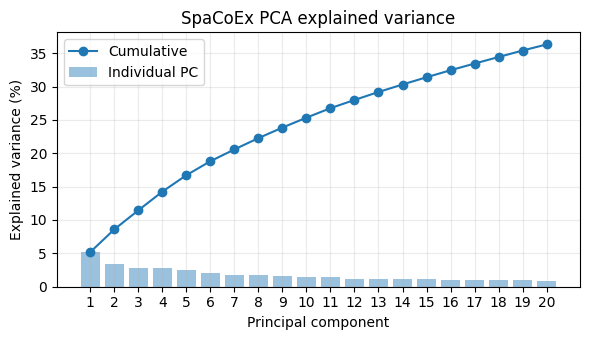

In [10]:
# ============================================================
# PCA explained variance for SpaCoEx correlation-only embedding
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Recreate the PCA object so we can access explained_variance_ratio_
selected_genes = old_corr_only["selected_genes"]

ad = adata[:, selected_genes].copy()
X_sel = dense(ad)

nbr_sel = neighbor_idx(ad, N_NEIGHBORS)

final_mats = local_corr(X_sel, nbr_sel)
final_metric_mats = logeuclid_mats(final_mats, reg=RIDGE)

F = logeuclid_features(final_metric_mats)
Z = StandardScaler().fit_transform(F)

n_components = min(N_PCS, Z.shape[0] - 1, Z.shape[1])

pca_check = PCA(
    n_components=n_components,
    random_state=RANDOM_STATE
)

scores_check = pca_check.fit_transform(Z)

pca_variance_table = pd.DataFrame({
    "PC": [f"PC{i+1}" for i in range(n_components)],
    "explained_variance_ratio": pca_check.explained_variance_ratio_,
    "explained_variance_percent": pca_check.explained_variance_ratio_ * 100,
    "cumulative_explained_variance": np.cumsum(pca_check.explained_variance_ratio_),
    "cumulative_explained_variance_percent": np.cumsum(pca_check.explained_variance_ratio_) * 100
})

display(pca_variance_table)

# Optional plot
plt.figure(figsize=(6, 3.5))
plt.plot(
    np.arange(1, n_components + 1),
    pca_variance_table["cumulative_explained_variance_percent"],
    marker="o",
    label="Cumulative"
)

plt.bar(
    np.arange(1, n_components + 1),
    pca_variance_table["explained_variance_percent"],
    alpha=0.45,
    label="Individual PC"
)

plt.xlabel("Principal component")
plt.ylabel("Explained variance (%)")
plt.title("SpaCoEx PCA explained variance")
plt.xticks(np.arange(1, n_components + 1))
plt.legend()
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

In [11]:
# ============================================================
# Plot all pairwise local-correlation diagrams for first 10 genes
# Each pair: local correlation, expression gene 1, expression gene 2
# ============================================================

def plot_first10_pairwise_local_corr_selfcontained(
    ad=None,
    genes=None,
    n_first=10,
    n_neighbors=None,
    point_size=12
):
    import numpy as np
    import matplotlib.pyplot as plt
    from itertools import combinations

    if ad is None:
        ad = adata

    if genes is None:
        if "old_corr_only" in globals():
            genes = list(old_corr_only["selected_genes"])
        else:
            genes = list(GENES_45)

    if n_neighbors is None:
        n_neighbors = N_NEIGHBORS

    genes_first = list(genes)[:n_first]

    missing = [g for g in genes_first if g not in ad.var_names]
    if missing:
        raise ValueError(f"Missing genes from adata: {missing}")

    print("Using genes:")
    print(genes_first)

    pairs = list(combinations(genes_first, 2))
    print("Number of pairs:", len(pairs))

    ad_first = ad[:, genes_first].copy()
    X_first = dense(ad_first)

    coords = coords_from(ad_first)
    nbr = neighbor_idx(ad_first, n_neighbors=n_neighbors)

    x_coord = coords[:, 1]
    y_coord = coords[:, 0]

    gene_to_idx = {
        gene: i
        for i, gene in enumerate(genes_first)
    }

    for gene1, gene2 in pairs:
        print(f"Plotting {gene1} vs {gene2}")

        i = gene_to_idx[gene1]
        j = gene_to_idx[gene2]

        local_corr_values = np.zeros(ad_first.n_obs, dtype=float)

        for spot_i, idx in enumerate(nbr):
            x1 = X_first[idx, i]
            x2 = X_first[idx, j]

            if np.std(x1) < 1e-12 or np.std(x2) < 1e-12:
                local_corr_values[spot_i] = 0.0
            else:
                local_corr_values[spot_i] = np.corrcoef(x1, x2)[0, 1]

        local_corr_values[~np.isfinite(local_corr_values)] = 0.0

        expr1 = X_first[:, i].astype(float)
        expr2 = X_first[:, j].astype(float)

        fig, axes = plt.subplots(1, 3, figsize=(8, 2.8))

        plots = [
            (local_corr_values, f"Local correlation\n{gene1} vs {gene2}", "coolwarm", -1, 1),
            (expr1, f"{gene1} expression", "viridis", None, None),
            (expr2, f"{gene2} expression", "viridis", None, None),
        ]

        for ax, (values, title, cmap, vmin, vmax) in zip(axes, plots):
            sca = ax.scatter(
                x_coord,
                y_coord,
                c=values,
                cmap=cmap,
                vmin=vmin,
                vmax=vmax,
                s=point_size,
                linewidths=0
            )
            ax.invert_yaxis()
            ax.set_aspect("equal")
            ax.axis("off")
            ax.set_title(title)
            plt.colorbar(sca, ax=ax, fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

Using genes:
['KRTDAP', 'KRT2', 'KRT6A', 'KRTCAP3', 'KRT34', 'KRT32', 'KRT31', 'KRT3', 'KRT23', 'KRT19']
Number of pairs: 45
Plotting KRTDAP vs KRT2


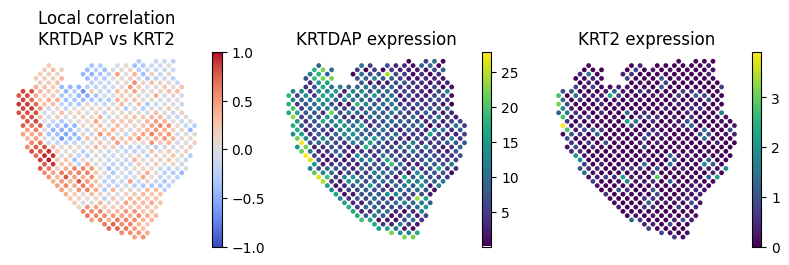

Plotting KRTDAP vs KRT6A


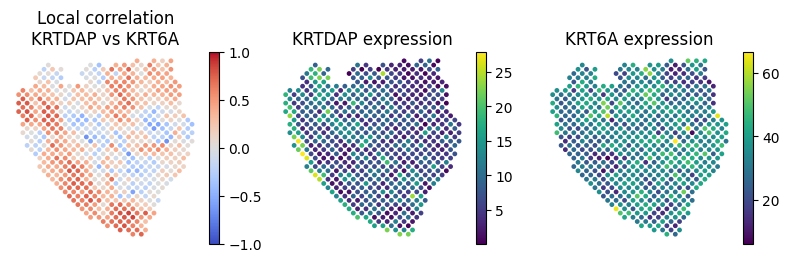

Plotting KRTDAP vs KRTCAP3


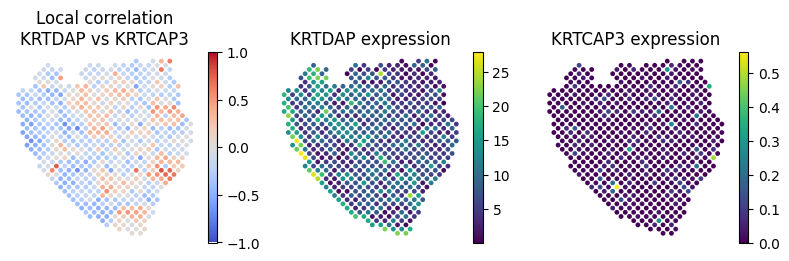

Plotting KRTDAP vs KRT34


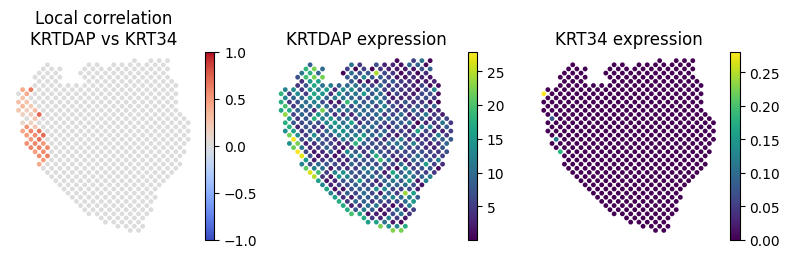

Plotting KRTDAP vs KRT32


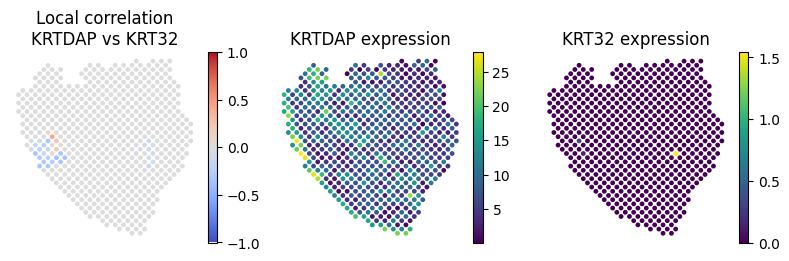

Plotting KRTDAP vs KRT31


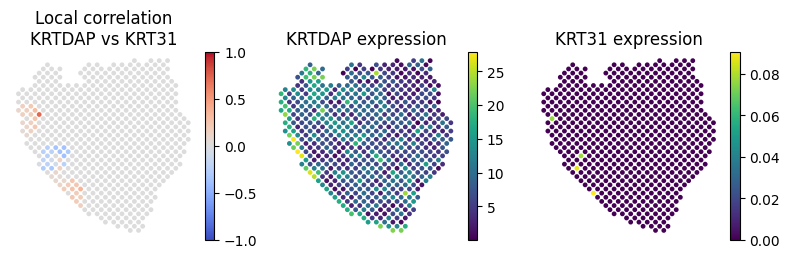

Plotting KRTDAP vs KRT3


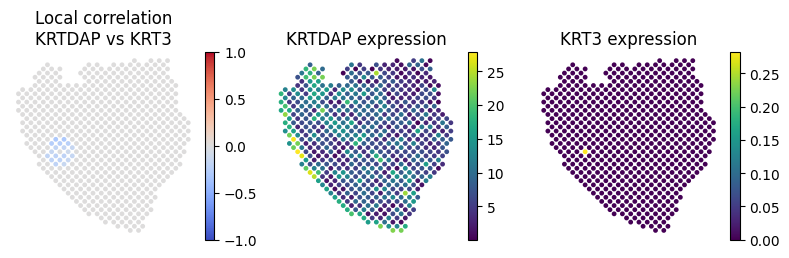

Plotting KRTDAP vs KRT23


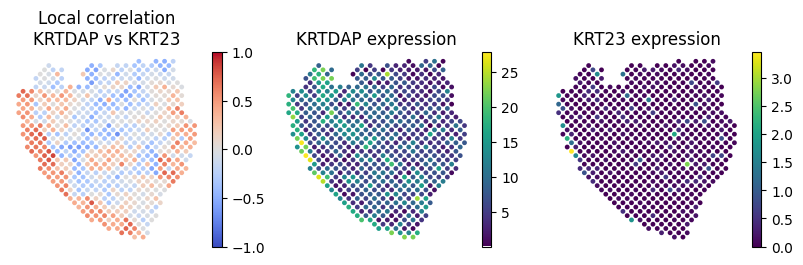

Plotting KRTDAP vs KRT19


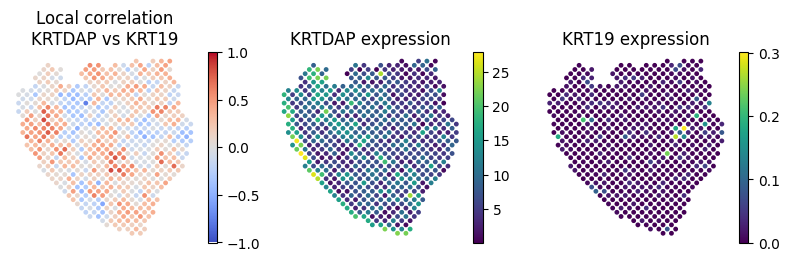

Plotting KRT2 vs KRT6A


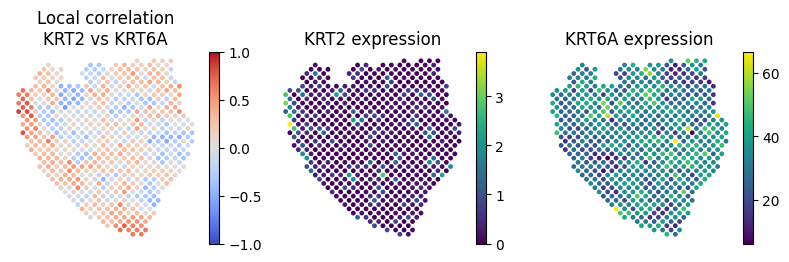

Plotting KRT2 vs KRTCAP3


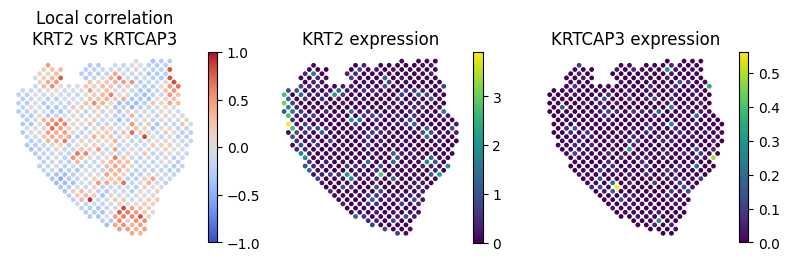

Plotting KRT2 vs KRT34


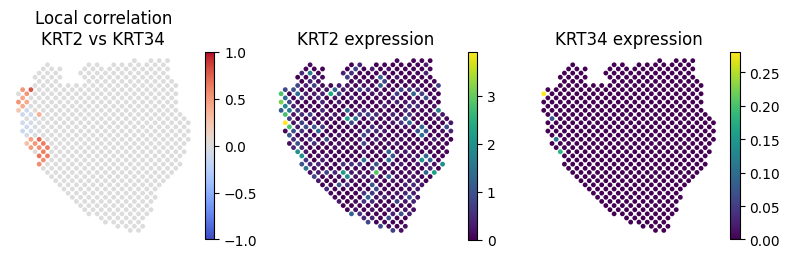

Plotting KRT2 vs KRT32


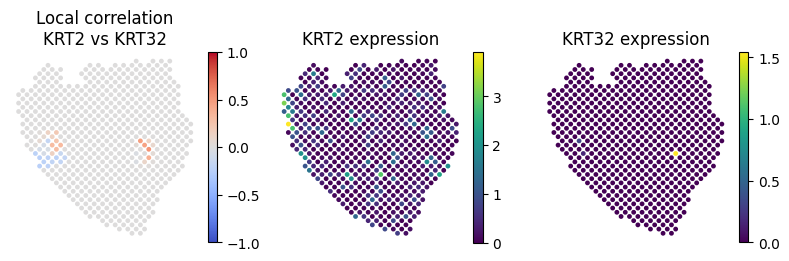

Plotting KRT2 vs KRT31


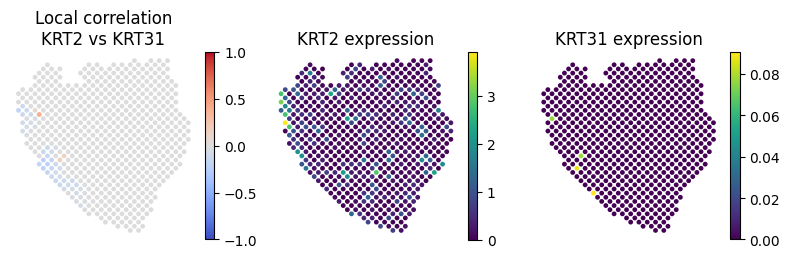

Plotting KRT2 vs KRT3


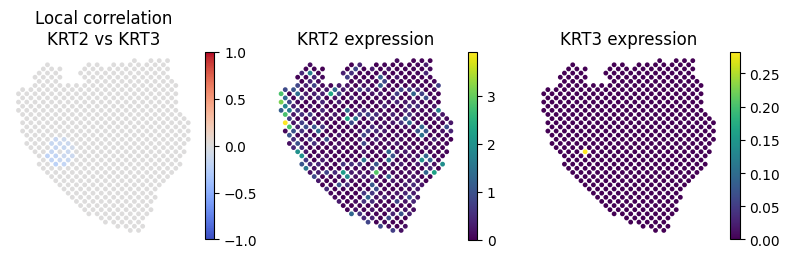

Plotting KRT2 vs KRT23


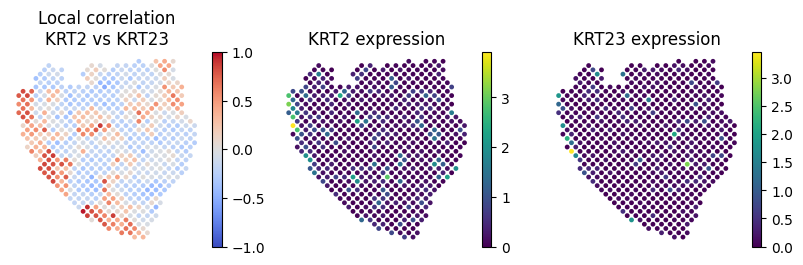

Plotting KRT2 vs KRT19


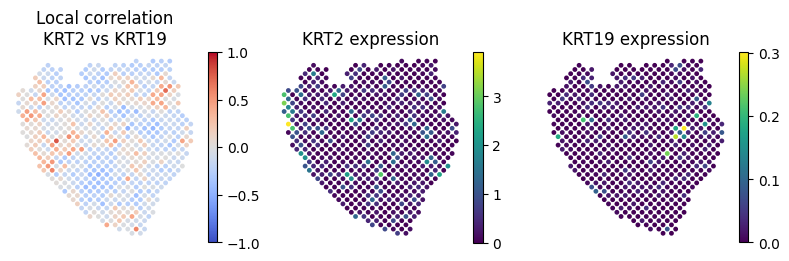

Plotting KRT6A vs KRTCAP3


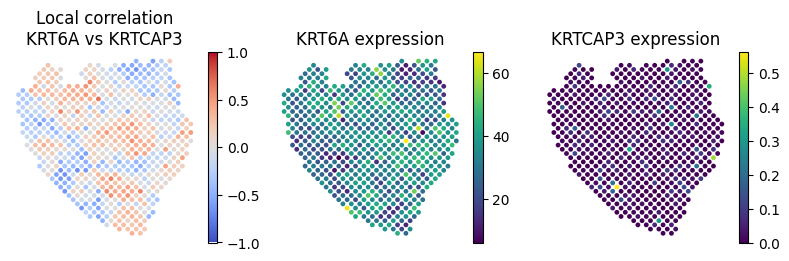

Plotting KRT6A vs KRT34


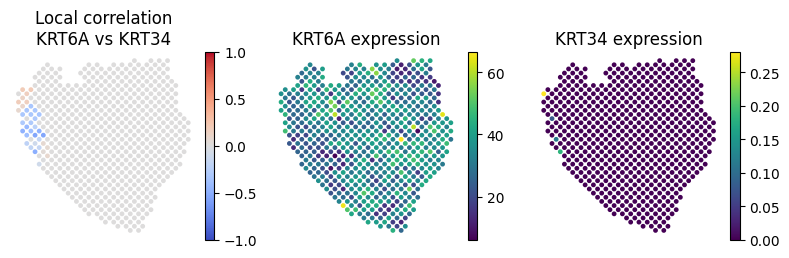

Plotting KRT6A vs KRT32


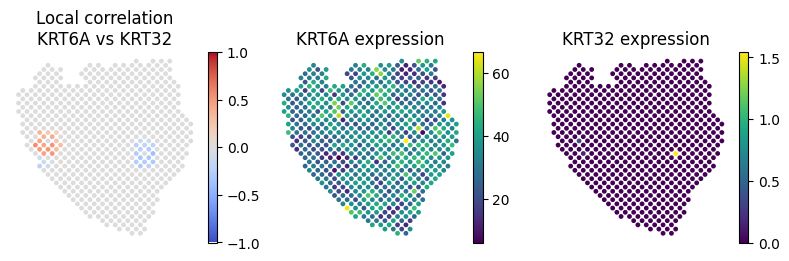

Plotting KRT6A vs KRT31


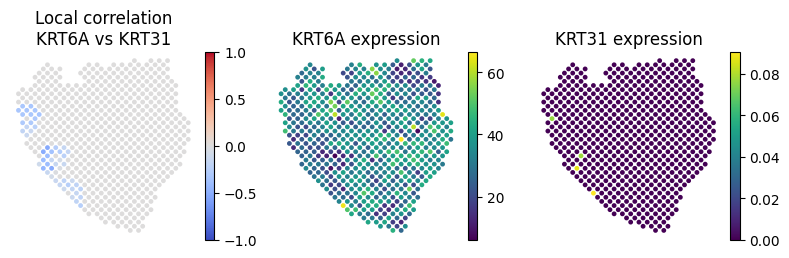

Plotting KRT6A vs KRT3


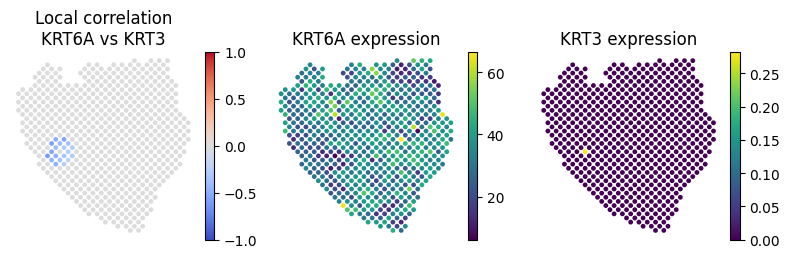

Plotting KRT6A vs KRT23


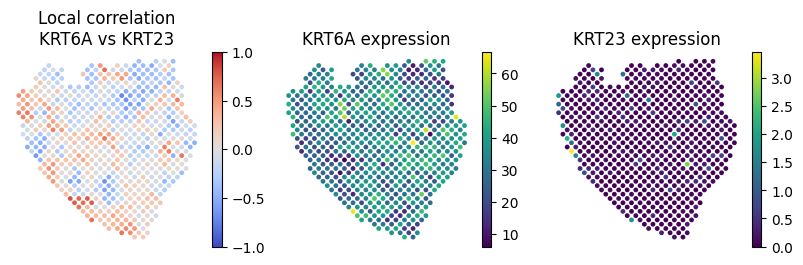

Plotting KRT6A vs KRT19


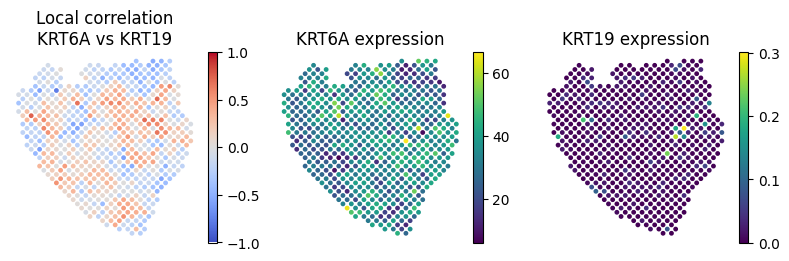

Plotting KRTCAP3 vs KRT34


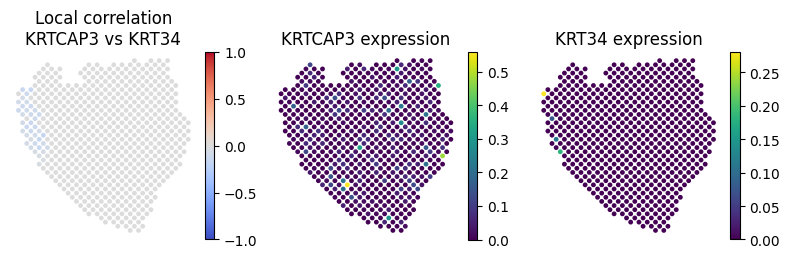

Plotting KRTCAP3 vs KRT32


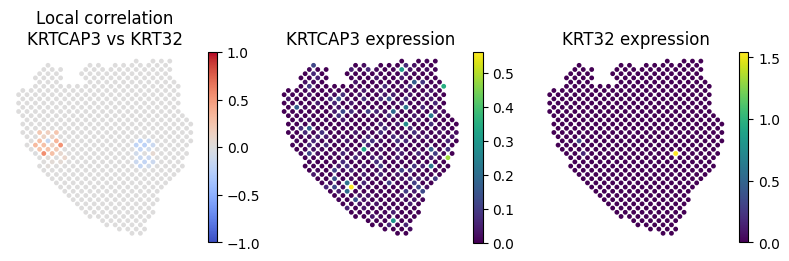

Plotting KRTCAP3 vs KRT31


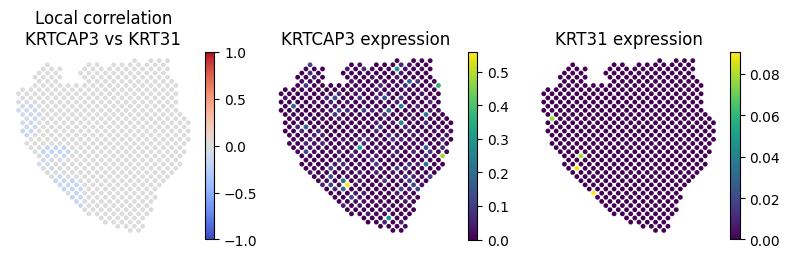

Plotting KRTCAP3 vs KRT3


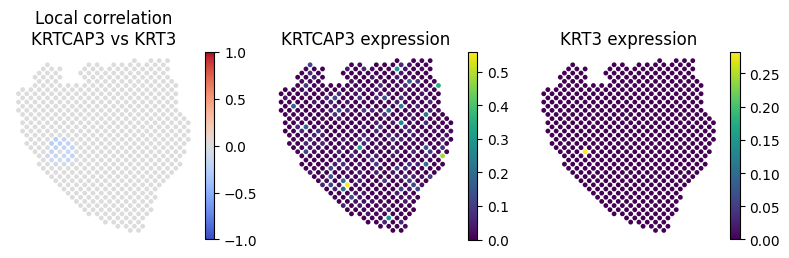

Plotting KRTCAP3 vs KRT23


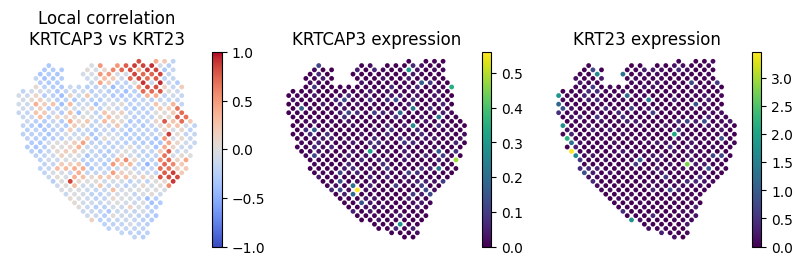

Plotting KRTCAP3 vs KRT19


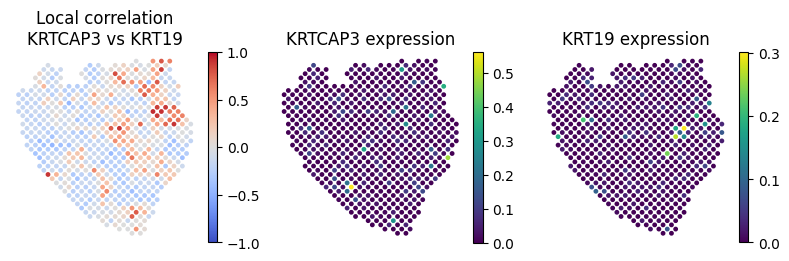

Plotting KRT34 vs KRT32


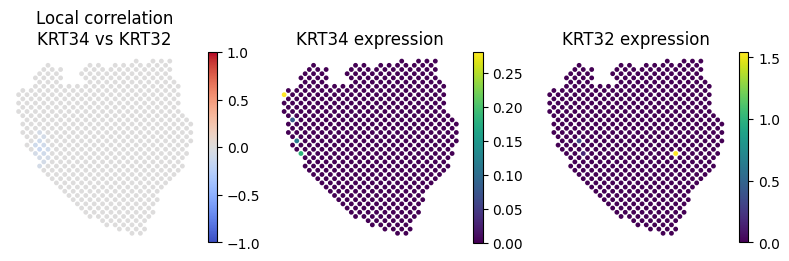

Plotting KRT34 vs KRT31


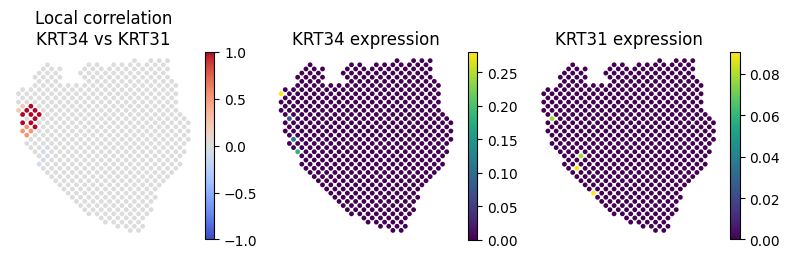

Plotting KRT34 vs KRT3


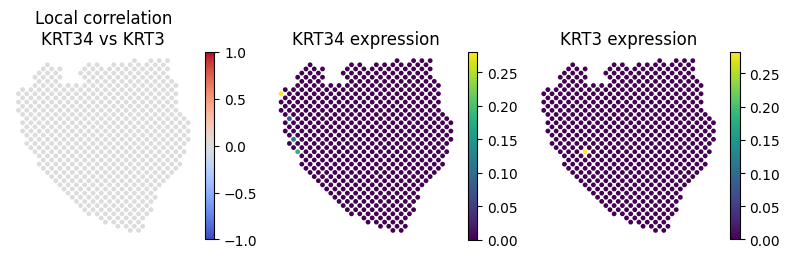

Plotting KRT34 vs KRT23


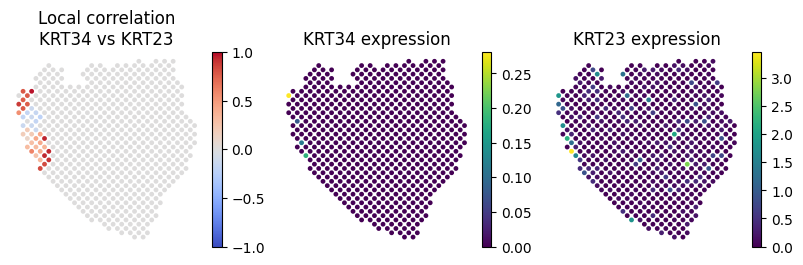

Plotting KRT34 vs KRT19


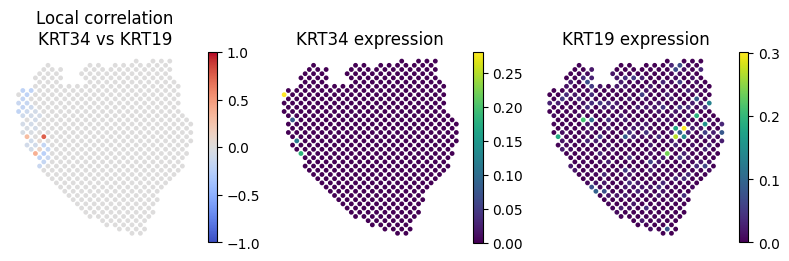

Plotting KRT32 vs KRT31


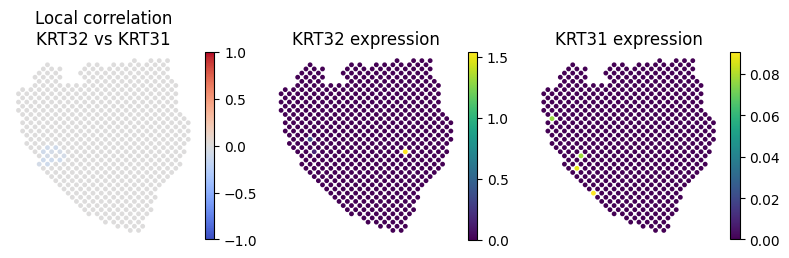

Plotting KRT32 vs KRT3


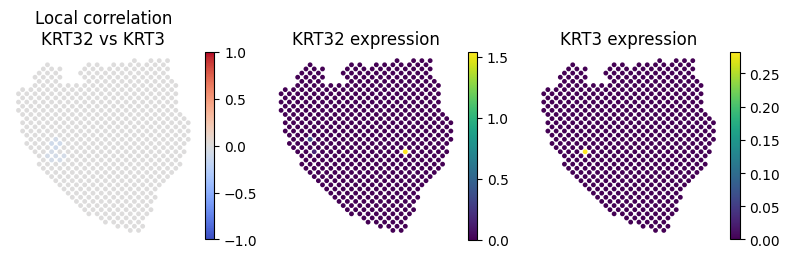

Plotting KRT32 vs KRT23


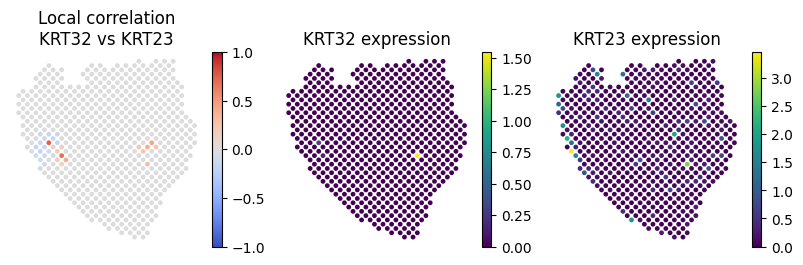

Plotting KRT32 vs KRT19


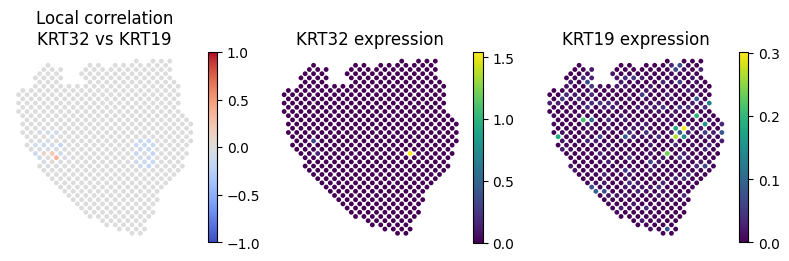

Plotting KRT31 vs KRT3


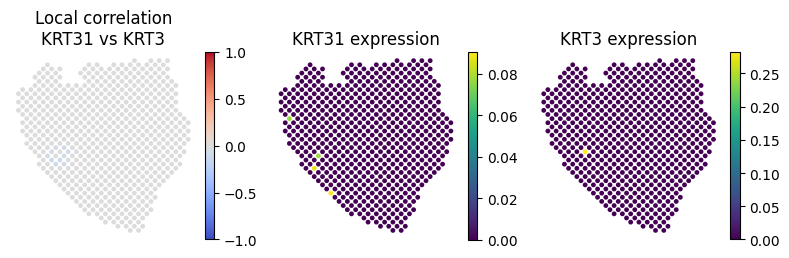

Plotting KRT31 vs KRT23


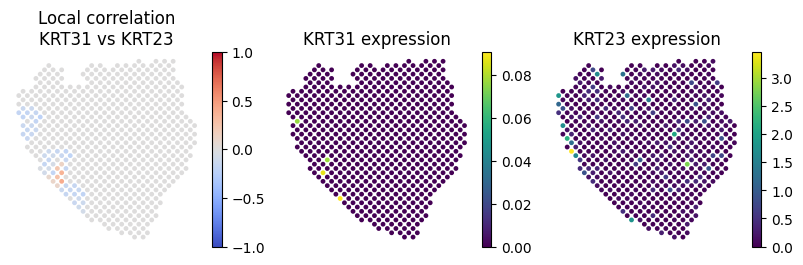

Plotting KRT31 vs KRT19


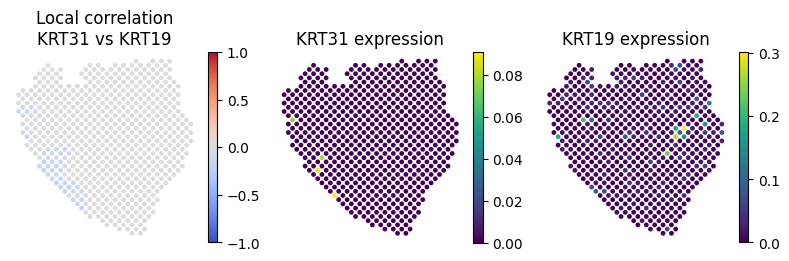

Plotting KRT3 vs KRT23


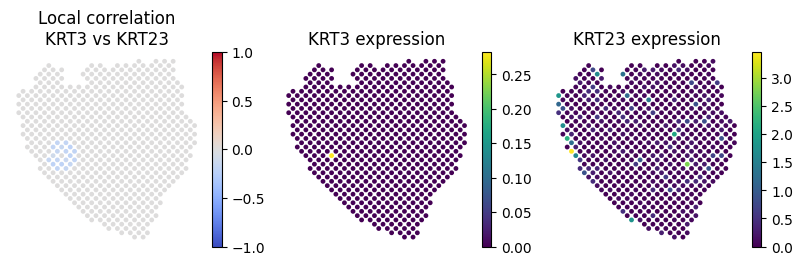

Plotting KRT3 vs KRT19


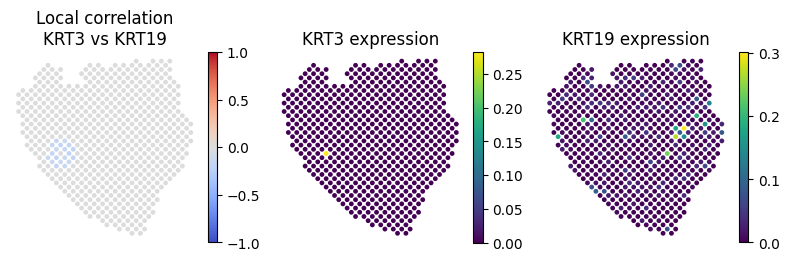

Plotting KRT23 vs KRT19


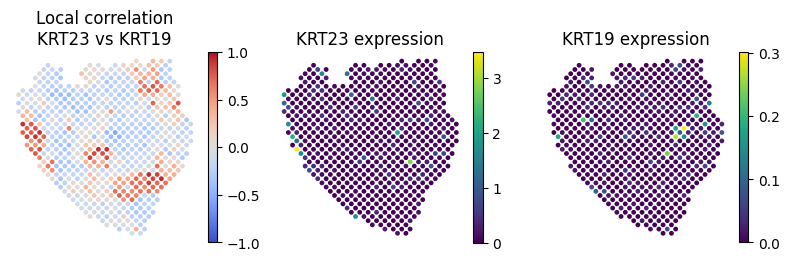

In [12]:
plot_first10_pairwise_local_corr_selfcontained(
    ad=adata,
    genes=old_corr_only["selected_genes"],
    n_first=10,
    n_neighbors=15,
    point_size=12
)

In [13]:
# ============================================================
# OLD DATA: EXPRESSION / COEXPRESSION / JOINT COMPARISON TABLE
# same style as comparison notebook
# ============================================================

import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import (
    adjusted_rand_score,
    normalized_mutual_info_score,
    silhouette_score
)

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

ALPHAS = [0.00, 0.25, 0.50, 0.75, 1.00]
N_JOINT_PCS = 5

# If the automatic choice is wrong, manually set this to "cluster"
# or whichever column is the SpatialCorr-provided BayesSpace annotation.
BAYES_COL = None

selected_genes = list(old_corr_only["selected_genes"])
print("SpaCoEx selected genes:", len(selected_genes))
print(selected_genes)

ad_eval = adata[:, selected_genes].copy()
ad_eval.var_names_make_unique()

coords_eval = coords_from(ad_eval)
nbr_eval = neighbor_idx(ad_eval, N_NEIGHBORS)

# ------------------------------------------------------------
# Find BayesSpace / baseline annotation
# ------------------------------------------------------------

obs_cols = list(adata.obs.columns)

if BAYES_COL is None:
    bayes_candidates = [c for c in obs_cols if "bayes" in c.lower()]

    if len(bayes_candidates) > 0:
        BAYES_COL = bayes_candidates[0]
    elif "cluster" in obs_cols:
        BAYES_COL = "cluster"
    else:
        low_card_cols = []
        for c in obs_cols:
            if adata.obs[c].nunique(dropna=True) <= 30:
                low_card_cols.append((c, adata.obs[c].nunique(dropna=True)))
        print("Possible annotation columns:")
        display(pd.DataFrame(low_card_cols, columns=["column", "n_unique"]))
        raise ValueError(
            "Could not automatically find BayesSpace annotation. "
            "Set BAYES_COL manually near the top of this cell."
        )

print("Using reference annotation column:", BAYES_COL)

obs_lookup = adata.obs.copy()
obs_lookup.index = obs_lookup.index.astype(str)

bayes_labels = (
    obs_lookup
    .loc[ad_eval.obs_names.astype(str), BAYES_COL]
    .astype(str)
    .to_numpy()
)

# ------------------------------------------------------------
# Metric functions
# ------------------------------------------------------------

def spatial_neighbor_agreement(labels, nbr_idx):
    labels = np.asarray(labels).astype(str)

    agree = 0
    total = 0

    for s, ids in enumerate(nbr_idx):
        ids = np.asarray(ids)
        ids = ids[ids != s]

        agree += np.sum(labels[ids] == labels[s])
        total += len(ids)

    return agree / total


def safe_silhouette(embedding, labels):
    labels = np.asarray(labels).astype(str)

    if len(np.unique(labels)) < 2:
        return np.nan
    if len(np.unique(labels)) >= len(labels):
        return np.nan

    return silhouette_score(np.asarray(embedding), labels)


def cluster_embedding(Z):
    Z = np.asarray(Z)

    labels = KMeans(
        n_clusters=N_CLUSTERS,
        n_init=50,
        random_state=RANDOM_STATE
    ).fit_predict(Z)

    return relabel_by_position(labels, coords_eval).astype(str)


def frob_normalize(Z):
    Z = np.asarray(Z, dtype=float)
    norm = np.linalg.norm(Z, ord="fro")

    if norm == 0:
        return Z

    return Z / norm


def evaluate_representation(name, alpha, labels, embedding):
    labels = np.asarray(labels).astype(str)

    return {
        "Representation": name,
        "alpha": alpha,
        "Spatial agreement": spatial_neighbor_agreement(labels, nbr_eval),
        "Silhouette": safe_silhouette(embedding, labels),
        "ARI": adjusted_rand_score(bayes_labels, labels),
        "NMI": normalized_mutual_info_score(bayes_labels, labels),
    }

# ------------------------------------------------------------
# Co-expression representation
# ------------------------------------------------------------

C_full = np.asarray(old_corr_only["embedding"])

coex_cluster_col = "Old_CorrOnly_cluster"
coex_labels = (
    old_corr_only["adata"]
    .obs[coex_cluster_col]
    .astype(str)
    .to_numpy()
)

C_joint = frob_normalize(C_full[:, :min(N_JOINT_PCS, C_full.shape[1])])

# ------------------------------------------------------------
# Expression representation using same SpaCoEx-selected genes
# ------------------------------------------------------------

X_expr = dense(ad_eval)
X_expr = StandardScaler().fit_transform(X_expr)

n_expr_pcs = min(N_PCS, X_expr.shape[0] - 1, X_expr.shape[1])

E_full = PCA(
    n_components=n_expr_pcs,
    random_state=RANDOM_STATE
).fit_transform(X_expr)

expr_labels = cluster_embedding(E_full)

E_joint = frob_normalize(E_full[:, :min(N_JOINT_PCS, E_full.shape[1])])

# Make sure expression and co-expression use same PC count for joint features
joint_dim = min(E_joint.shape[1], C_joint.shape[1])
E_joint = E_joint[:, :joint_dim]
C_joint = C_joint[:, :joint_dim]

# ------------------------------------------------------------
# Build alpha comparison table
# ------------------------------------------------------------

rows = []

for alpha in ALPHAS:
    if np.isclose(alpha, 0.0):
        labels = coex_labels.copy()
        embedding = C_full
        name = "Co-expression only"

    elif np.isclose(alpha, 1.0):
        labels = expr_labels.copy()
        embedding = E_full
        name = "Expression only"

    else:
        embedding = np.hstack([
            np.sqrt(alpha) * E_joint,
            np.sqrt(1.0 - alpha) * C_joint
        ])

        labels = cluster_embedding(embedding)
        name = "Joint"

    rows.append(
        evaluate_representation(
            name=name,
            alpha=alpha,
            labels=labels,
            embedding=embedding
        )
    )

joint_comparison_table = pd.DataFrame(rows)

display(joint_comparison_table.round(3))

# ------------------------------------------------------------
# LaTeX table output
# ------------------------------------------------------------

latex_table = joint_comparison_table.copy()

print(
    latex_table.to_latex(
        index=False,
        float_format="%.3f",
        escape=False
    )
)

SpaCoEx selected genes: 29
['KRTDAP', 'KRT2', 'KRT6A', 'KRTCAP3', 'KRT34', 'KRT32', 'KRT31', 'KRT3', 'KRT23', 'KRT19', 'KRT6C', 'KRT18', 'KRT17', 'KRT16', 'KRT15', 'KRT14', 'KRT13', 'KRT10', 'KRT6B', 'KRT5', 'KRT7', 'KRT77', 'KRTCAP2', 'KRT80', 'KRT8', 'KRT79', 'KRT78', 'KRT1', 'KRT75']
Using reference annotation column: cluster


,Representation,alpha,Spatial agreement,Silhouette,ARI,NMI
0,Co-expression only,0.00,0.762,0.170,0.143,0.290
1,Joint,0.25,0.549,0.213,0.186,0.341
2,Joint,0.50,0.524,0.226,0.158,0.317
3,Joint,0.75,0.417,0.175,0.147,0.302
4,Expression only,1.00,0.499,0.122,0.128,0.273


\begin{tabular}{lrrrrr}
\toprule
Representation & alpha & Spatial agreement & Silhouette & ARI & NMI \\
\midrule
Co-expression only & 0.000 & 0.762 & 0.170 & 0.143 & 0.290 \\
Joint & 0.250 & 0.549 & 0.213 & 0.186 & 0.341 \\
Joint & 0.500 & 0.524 & 0.226 & 0.158 & 0.317 \\
Joint & 0.750 & 0.417 & 0.175 & 0.147 & 0.302 \\
Expression only & 1.000 & 0.499 & 0.122 & 0.128 & 0.273 \\
\bottomrule
\end{tabular}



Running SpaGCN...


C:\Users\mcjia\miniconda3\envs\python311\Lib\site-packages\anndata\__init__.py:70: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  return module_get_attr_redirect(attr_name, deprecated_mapping=_DEPRECATED)
C:\Users\mcjia\miniconda3\envs\python311\Lib\site-packages\anndata\__init__.py:70: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  return module_get_attr_redirect(attr_name, deprecated_mapping=_DEPRECATED)
C:\Users\mcjia\miniconda3\envs\python311\Lib\site-packages\anndata\__init__.py:70: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  return module_get_attr_redirect(attr_name, deprecated_mapping=_DEPRECATED)


Calculateing adj matrix using xy only...
Run 1: l [0.01, 1000], p [0.0, 619.8709037446376]
Run 2: l [0.01, 500.005], p [0.0, 619.48388671875]
Run 3: l [0.01, 250.0075], p [0.0, 617.9400024414062]
Run 4: l [0.01, 125.00874999999999], p [0.0, 611.8302001953125]
Run 5: l [0.01, 62.509375], p [0.0, 588.3961181640625]
Run 6: l [0.01, 31.2596875], p [0.0, 508.5400695800781]
Run 7: l [0.01, 15.63484375], p [0.0, 322.9195251464844]
Run 8: l [0.01, 7.822421875], p [0.0, 129.32113647460938]
Run 9: l [0.01, 3.9162109375], p [0.0, 38.97809600830078]
Run 10: l [0.01, 1.9631054687499998], p [0.0, 10.037469863891602]
Run 11: l [0.01, 0.9865527343749999], p [0.0, 1.9320404529571533]
Run 12: l [0.49827636718749996, 0.9865527343749999], p [0.06864845752716064, 1.9320404529571533]
Run 13: l [0.49827636718749996, 0.74241455078125], p [0.06864845752716064, 0.7188689708709717]
Run 14: l [0.620345458984375, 0.74241455078125], p [0.30232858657836914, 0.7188689708709717]
recommended l =  0.6813800048828125
Ini

C:\Users\mcjia\miniconda3\envs\python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Epoch  0
Epoch  10
delta_label  0.004830917874396135 < tol  0.005
Reach tolerance threshold. Stopping training.
Total epoch: 16
Initializing cluster centers with louvain, resolution =  0.3
Epoch  0
Epoch  10
delta_label  0.004830917874396135 < tol  0.005
Reach tolerance threshold. Stopping training.
Total epoch: 16
Initializing cluster centers with louvain, resolution =  0.4
Epoch  0
Epoch  10
Initializing cluster centers with louvain, resolution =  0.5
Epoch  0
Epoch  10
Initializing cluster centers with louvain, resolution =  0.6
Epoch  0
Epoch  10
Initializing cluster centers with louvain, resolution =  0.7
Epoch  0
Epoch  10
Initializing cluster centers with louvain, resolution =  0.8
Epoch  0
Epoch  10
Initializing cluster centers with louvain, resolution =  0.9
Epoch  0
Epoch  10
Initializing cluster centers with louvain, resolution =  1.0
Epoch  0
Epoch  10
Initializing cluster centers with louvain, resolution =  1.1
Epoch  0
Epoch  10
Initializing cluster centers with louvain, 

,res,n_clusters,diff
0,0.2,2,8
1,0.3,2,8
2,0.4,4,6
3,0.5,5,5
4,0.6,6,4
5,0.7,7,3
6,0.8,7,3
7,0.9,7,3
8,1.0,9,1
9,1.1,9,1


Chosen SpaGCN resolution: 1.0
SpaGCN clusters at chosen resolution: 9
SpaGCN num_pcs: 26
Initializing cluster centers with louvain, resolution =  1.0
Epoch  0
Epoch  10
Epoch  20
Epoch  30
Epoch  40
delta_label  0.00322061191626409 < tol  0.005
Reach tolerance threshold. Stopping training.
Total epoch: 43
Finished SpaGCN
Running stLearn...
Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Applying Kmeans cluster ...
Kmeans cluster is done! The labels are stored in adata.obs["kmeans"]
Finished stLearn
Running GraphST...


C:\Users\mcjia\miniconda3\envs\python311\Lib\site-packages\legacy_api_wrap\__init__.py:88: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


Begin to train ST data...


100%|██████████| 600/600 [00:08<00:00, 74.78it/s]


Optimization finished for ST data!
Finished GraphST


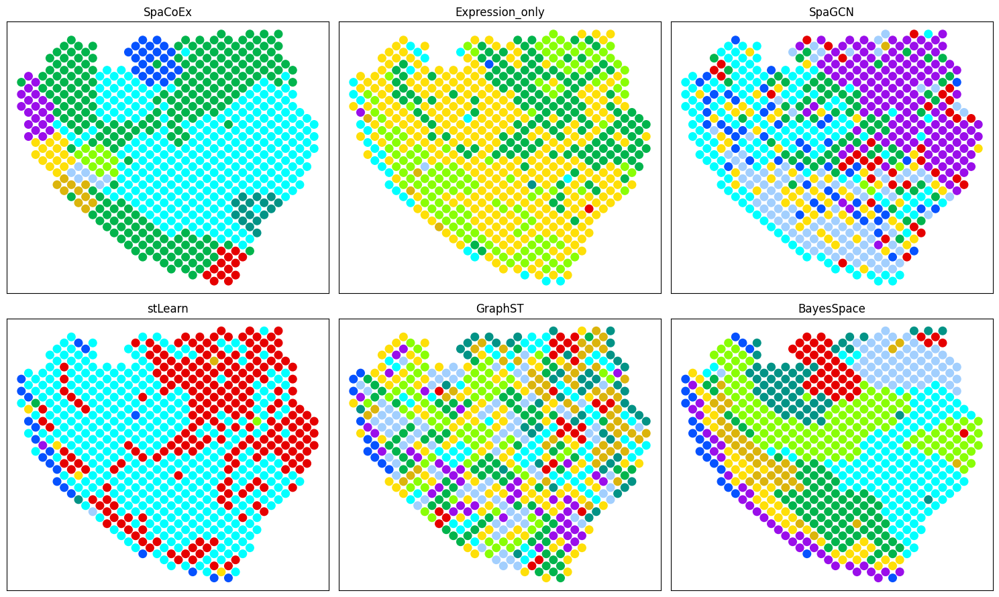

,method,n_clusters,spatial_neighbor_agreement,silhouette
0,SpaCoEx,10,0.761889,0.170006
1,Expression_only,10,0.498765,0.122247
2,SpaGCN,9,0.387118,NaN
3,stLearn,10,0.638218,0.095884
4,GraphST,10,0.228771,0.085977
5,BayesSpace,10,0.599678,NaN


,method_a,method_b,ARI,NMI
0,SpaCoEx,Expression_only,0.066201,0.122272
1,SpaCoEx,SpaGCN,0.012736,0.092175
2,SpaCoEx,stLearn,0.045297,0.086322
3,SpaCoEx,GraphST,0.006833,0.085159
4,SpaCoEx,BayesSpace,0.143224,0.290458
5,Expression_only,SpaGCN,0.090154,0.167900
6,Expression_only,stLearn,0.377353,0.353255
7,Expression_only,GraphST,0.028232,0.087477
8,Expression_only,BayesSpace,0.128483,0.273143
9,SpaGCN,stLearn,0.096893,0.169621


,method,cluster,n_spots
0,SpaCoEx,1,23
1,SpaCoEx,10,13
2,SpaCoEx,2,20
3,SpaCoEx,3,230
4,SpaCoEx,4,15
5,SpaCoEx,5,275
6,SpaCoEx,6,12
7,SpaCoEx,7,7
8,SpaCoEx,8,10
9,SpaCoEx,9,16


,Method,n_clusters,Spatial agreement,Silhouette,ARI_vs_BayesSpace,NMI_vs_BayesSpace
0,SpaCoEx,10,0.762,0.170,0.143,0.290
1,Expression_only,10,0.499,0.122,0.128,0.273
2,SpaGCN,9,0.387,NaN,0.095,0.223
3,stLearn,10,0.638,0.096,0.068,0.196
4,GraphST,10,0.229,0.086,0.031,0.116


\begin{tabular}{lrrrrr}
\toprule
Method & n_clusters & Spatial agreement & Silhouette & ARI_vs_BayesSpace & NMI_vs_BayesSpace \\
\midrule
SpaCoEx & 10 & 0.762 & 0.170 & 0.143 & 0.290 \\
Expression_only & 10 & 0.499 & 0.122 & 0.128 & 0.273 \\
SpaGCN & 9 & 0.387 & NaN & 0.095 & 0.223 \\
stLearn & 10 & 0.638 & 0.096 & 0.068 & 0.196 \\
GraphST & 10 & 0.229 & 0.086 & 0.031 & 0.116 \\
\bottomrule
\end{tabular}



In [14]:
# ============================================================
# OLD DATA: FULL COMPARISON AGAINST OTHER METHODS
# modeled from comparison (2).ipynb
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy import sparse
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import (
    adjusted_rand_score,
    normalized_mutual_info_score,
    silhouette_score
)

# Fix for newer scipy where csr_matrix.A may be missing
if not hasattr(sparse.csr_matrix, "A"):
    sparse.csr_matrix.A = property(lambda self: self.toarray())

# ------------------------------------------------------------
# Use same objects as the old comparison notebook
# ------------------------------------------------------------

result = old_corr_only

adata_spacoex = result["adata"].copy()
selected_genes = list(result["selected_genes"])
scores = np.asarray(result["embedding"])
clusters = adata_spacoex.obs["Old_CorrOnly_cluster"].astype(str).to_numpy()

X_sel = dense(adata_spacoex)
coords_sel = coords_from(adata_spacoex)
nbr_sel = neighbor_idx(adata_spacoex, N_NEIGHBORS)

base_spots = pd.DataFrame({
    "spot_id": adata_spacoex.obs_names.astype(str),
    "row": coords_sel[:, 0],
    "col": coords_sel[:, 1]
})

# External methods in comparison (2) were run on adata_g, not only selected genes
adata_external = adata_g.copy()
coords_external = coords_from(adata_external)

# ------------------------------------------------------------
# Expression-only control, same as comparison (2)
# ------------------------------------------------------------

expr_Z = StandardScaler().fit_transform(X_sel)

expr_pca = PCA(
    n_components=min(N_PCS, X_sel.shape[1]),
    random_state=RANDOM_STATE
)

expr_scores = expr_pca.fit_transform(expr_Z)

expr_raw = KMeans(
    n_clusters=N_CLUSTERS,
    n_init=50,
    random_state=RANDOM_STATE
).fit_predict(expr_scores)

expr_clusters = relabel_by_position(expr_raw, coords_sel).astype(str)

adata_spacoex.obs["Expression_cluster"] = expr_clusters
adata_spacoex.obs["Expression_PC1"] = expr_scores[:, 0]
adata_spacoex.obs["Expression_PC2"] = expr_scores[:, 1] if expr_scores.shape[1] > 1 else 0

# ------------------------------------------------------------
# Comparison framework from comparison (2)
# ------------------------------------------------------------

method_labels = {
    "SpaCoEx": np.asarray(clusters).astype(str),
    "Expression_only": np.asarray(expr_clusters).astype(str)
}

method_embeddings = {
    "SpaCoEx": scores,
    "Expression_only": expr_scores
}

failures = []

def make_method_output(method, labels):
    return base_spots.assign(
        method=method,
        cluster=np.asarray(labels).astype(str)
    )

def spatial_neighbor_agreement(labels, nbr_idx):
    labels = np.asarray(labels).astype(str)
    agree, total = 0, 0

    for i, ids in enumerate(nbr_idx):
        ids = np.asarray(ids)
        ids = ids[ids != i]
        agree += np.sum(labels[ids] == labels[i])
        total += len(ids)

    return agree / total

def safe_silhouette(emb, labels):
    if emb is None:
        return np.nan

    labels = np.asarray(labels).astype(str)

    if len(pd.unique(labels)) < 2:
        return np.nan
    if len(pd.unique(labels)) >= len(labels):
        return np.nan

    return silhouette_score(np.asarray(emb), labels)

def cluster_size_table(method_labels):
    rows = []

    for method, labels in method_labels.items():
        counts = pd.Series(labels).astype(str).value_counts().sort_index()

        for cluster, n in counts.items():
            rows.append({
                "method": method,
                "cluster": cluster,
                "n_spots": n
            })

    return pd.DataFrame(rows)

def method_metric_table(method_labels, method_embeddings, nbr_idx):
    rows = []

    for method, labels in method_labels.items():
        labels = np.asarray(labels).astype(str)
        emb = method_embeddings.get(method, None)

        rows.append({
            "method": method,
            "n_clusters": len(pd.unique(labels)),
            "spatial_neighbor_agreement": spatial_neighbor_agreement(labels, nbr_idx),
            "silhouette": safe_silhouette(emb, labels)
        })

    return pd.DataFrame(rows)

def method_agreement_table(method_labels):
    methods = list(method_labels.keys())
    rows = []

    for i in range(len(methods)):
        for j in range(i + 1, len(methods)):
            a, b = methods[i], methods[j]

            rows.append({
                "method_a": a,
                "method_b": b,
                "ARI": adjusted_rand_score(method_labels[a], method_labels[b]),
                "NMI": normalized_mutual_info_score(method_labels[a], method_labels[b])
            })

    return pd.DataFrame(rows)

def refresh_comparison(display_now=True):
    global method_outputs, comparison_metrics, cluster_sizes, method_agreement

    method_outputs = pd.concat(
        [make_method_output(m, labs) for m, labs in method_labels.items()],
        ignore_index=True
    )

    comparison_metrics = method_metric_table(
        method_labels,
        method_embeddings,
        nbr_sel
    )

    cluster_sizes = cluster_size_table(method_labels)
    method_agreement = method_agreement_table(method_labels)

    if display_now:
        display(comparison_metrics)
        display(method_agreement)

def add_method_labels(method_name, labels, embedding=None):
    labels = np.asarray(labels).astype(str)

    if len(labels) != len(base_spots):
        raise ValueError(
            f"{method_name} labels have length {len(labels)}, "
            f"expected {len(base_spots)}"
        )

    method_labels[method_name] = labels
    method_embeddings[method_name] = embedding
    refresh_comparison(display_now=False)

def plot_method_grid(method_labels, ncols=3):
    methods = list(method_labels.keys())
    n = len(methods)
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(5 * ncols, 4.5 * nrows)
    )

    axes = np.asarray(axes).reshape(-1)

    for ax, method in zip(axes, methods):
        spatialcorr.plot_slide(
            base_spots,
            pd.Series(method_labels[method], index=base_spots.index),
            cmap="categorical",
            colorbar=False,
            title=method,
            ticks=False,
            dsize=70,
            ax=ax,
            figure=fig
        )

    for ax in axes[n:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# External method helpers from comparison (2)
# ------------------------------------------------------------

def prepare_external_adata(adata_in, coords):
    ad = adata_in.copy()
    ad.var_names_make_unique()
    ad.obsm["spatial"] = np.asarray(coords, dtype=float)
    ad.obs["spot_id"] = ad.obs_names.astype(str)
    ad.obs["row"] = coords[:, 0]
    ad.obs["col"] = coords[:, 1]
    return ad

def run_spagcn(adata_in, coords, n_clusters=N_CLUSTERS, seed=RANDOM_STATE):
    import random, torch, scanpy as sc, SpaGCN as spg

    ad = prepare_external_adata(adata_in, coords)

    x = ad.obs["row"].tolist()
    y = ad.obs["col"].tolist()

    adj = spg.calculate_adj_matrix(x=x, y=y, histology=False)

    spg.prefilter_genes(ad, min_cells=3)
    spg.prefilter_specialgenes(ad)
    sc.pp.normalize_total(ad)
    sc.pp.log1p(ad)

    num_pcs = min(30, ad.n_obs, ad.n_vars)

    if num_pcs < 2:
        raise ValueError(f"SpaGCN has too few genes after filtering: ad.n_vars={ad.n_vars}")

    p = 0.5
    l = spg.search_l(
        p,
        adj,
        start=0.01,
        end=1000,
        tol=0.01,
        max_run=100
    )

    def train_count(res, max_epochs=20):
        random.seed(seed)
        torch.manual_seed(seed)
        np.random.seed(seed)

        clf = spg.SpaGCN()
        clf.set_l(l)

        clf.train(
            ad,
            adj,
            num_pcs=num_pcs,
            init_spa=True,
            init="louvain",
            res=res,
            tol=5e-3,
            lr=0.05,
            max_epochs=max_epochs
        )

        pred, _ = clf.predict()
        return len(set(pred)), pred

    res_grid = np.round(np.arange(0.2, 2.1, 0.1), 2)
    res_rows = []

    for res in res_grid:
        n_found, _ = train_count(res, max_epochs=20)

        res_rows.append({
            "res": res,
            "n_clusters": n_found,
            "diff": abs(n_found - n_clusters)
        })

    res_table = pd.DataFrame(res_rows)
    display(res_table)

    best = res_table.sort_values(["diff", "res"]).iloc[0]
    res = float(best["res"])

    print("Chosen SpaGCN resolution:", res)
    print("SpaGCN clusters at chosen resolution:", int(best["n_clusters"]))
    print("SpaGCN num_pcs:", num_pcs)

    random.seed(seed)
    torch.manual_seed(seed)
    np.random.seed(seed)

    clf = spg.SpaGCN()
    clf.set_l(l)

    clf.train(
        ad,
        adj,
        num_pcs=num_pcs,
        init_spa=True,
        init="louvain",
        res=res,
        tol=5e-3,
        lr=0.05,
        max_epochs=200
    )

    pred, prob = clf.predict()

    ad.obs["SpaGCN_cluster"] = np.asarray(pred).astype(str)

    return ad, ad.obs["SpaGCN_cluster"].to_numpy()

def run_stlearn(adata_in, coords, n_clusters=N_CLUSTERS, seed=RANDOM_STATE):
    import stlearn as st

    ad = prepare_external_adata(adata_in, coords)

    st.pp.filter_genes(ad, min_cells=1)
    st.pp.normalize_total(ad)
    st.pp.log1p(ad)
    st.pp.scale(ad)

    n_comps = min(50, ad.n_obs - 1, ad.n_vars - 1)

    st.em.run_pca(ad, n_comps=n_comps)

    st.tl.clustering.kmeans(
        ad,
        n_clusters=n_clusters,
        use_data="X_pca",
        random_state=seed,
        key_added="stlearn_kmeans"
    )

    labels = ad.obs["stlearn_kmeans"].astype(str).to_numpy()
    emb = ad.obsm["X_pca"]

    return ad, labels, emb

def run_graphst(adata_in, coords, n_clusters=N_CLUSTERS, seed=RANDOM_STATE):
    import torch
    from GraphST import GraphST

    ad = prepare_external_adata(adata_in, coords)

    np.random.seed(seed)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = GraphST.GraphST(ad, device=device)
    ad = model.train()

    emb = ad.obsm["emb"]

    labels = KMeans(
        n_clusters=n_clusters,
        n_init=50,
        random_state=seed
    ).fit_predict(emb)

    ad.obs["GraphST_cluster"] = labels.astype(str)

    return ad, ad.obs["GraphST_cluster"].to_numpy(), emb

# ------------------------------------------------------------
# Run/add external methods
# ------------------------------------------------------------

for method_name, runner in [
    ("SpaGCN", run_spagcn),
    ("stLearn", run_stlearn),
    ("GraphST", run_graphst),
]:
    print(f"Running {method_name}...")

    try:
        out = runner(
            adata_external,
            coords_external,
            n_clusters=N_CLUSTERS,
            seed=RANDOM_STATE
        )

        if len(out) == 2:
            ad_method, labels = out
            emb = None
        else:
            ad_method, labels, emb = out

        add_method_labels(method_name, labels, embedding=emb)

        print(f"Finished {method_name}")

    except Exception as e:
        failures.append({
            "method": method_name,
            "error_type": type(e).__name__,
            "error": str(e)
        })

        print(f"{method_name} failed:", repr(e))

# ------------------------------------------------------------
# Add SpatialCorr-provided BayesSpace annotation
# In this dataset, comparison (2) used adata.obs['cluster']
# ------------------------------------------------------------

BASELINE_COLUMN = "cluster"

if BASELINE_COLUMN not in adata.obs.columns:
    raise ValueError(f"{BASELINE_COLUMN} not found in adata.obs")

spot_ids = base_spots["spot_id"].astype(str).to_numpy()
adata.obs_names = adata.obs_names.astype(str)

bayes_labels = adata.obs.loc[spot_ids, BASELINE_COLUMN].astype(str).to_numpy()

add_method_labels(
    "BayesSpace",
    bayes_labels,
    embedding=None
)

# ------------------------------------------------------------
# Final outputs: this is what comparison (2)'s last cells did
# ------------------------------------------------------------

refresh_comparison(display_now=False)

plot_method_grid(method_labels)

display(comparison_metrics)
display(method_agreement)
display(cluster_sizes)

if len(failures) > 0:
    print("Failures")
    display(pd.DataFrame(failures))

# ------------------------------------------------------------
# Paper-ready table: each method vs BayesSpace
# ------------------------------------------------------------

bayes_name = "BayesSpace"

paper_rows = []

for method in method_labels:
    if method == bayes_name:
        continue

    labels = method_labels[method]

    paper_rows.append({
        "Method": method,
        "n_clusters": len(pd.unique(labels)),
        "Spatial agreement": spatial_neighbor_agreement(labels, nbr_sel),
        "Silhouette": safe_silhouette(method_embeddings.get(method), labels),
        "ARI_vs_BayesSpace": adjusted_rand_score(labels, method_labels[bayes_name]),
        "NMI_vs_BayesSpace": normalized_mutual_info_score(labels, method_labels[bayes_name])
    })

paper_method_table = pd.DataFrame(paper_rows).sort_values(
    ["ARI_vs_BayesSpace", "NMI_vs_BayesSpace"],
    ascending=False
)

display(paper_method_table.round(3))

print(
    paper_method_table.to_latex(
        index=False,
        float_format="%.3f",
        escape=False
    )
)

In [15]:
def plot_spacoex_pc_sweep(pc_list=(1, 2, 3, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50), result=old_corr_only, point_size=20, ncols=4):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from sklearn.preprocessing import StandardScaler
    from sklearn.decomposition import PCA
    from sklearn.cluster import KMeans

    genes = list(result["selected_genes"])
    ad = adata[:, genes].copy()
    X_sel = dense(ad)
    coords = coords_from(ad)
    nbr = neighbor_idx(ad, N_NEIGHBORS)

    mats = local_corr(X_sel, nbr)
    metric_mats = logeuclid_mats(mats, reg=RIDGE)
    F = logeuclid_features(metric_mats)
    Z = StandardScaler().fit_transform(F)

    max_pcs = min(max(pc_list), Z.shape[0] - 1, Z.shape[1])
    pca = PCA(n_components=max_pcs, random_state=RANDOM_STATE)
    scores_all = pca.fit_transform(Z)

    rows = []
    labels_by_pc = {}

    for n_pcs in pc_list:
        n_pcs = min(n_pcs, scores_all.shape[1])
        scores = scores_all[:, :n_pcs]

        raw = KMeans(
            n_clusters=N_CLUSTERS,
            n_init=50,
            random_state=RANDOM_STATE
        ).fit_predict(scores)

        labels = relabel_by_position(raw, coords).astype(str)
        labels_by_pc[n_pcs] = labels

        rows.append({
            "n_pcs": n_pcs,
            "cumulative_variance_percent": pca.explained_variance_ratio_[:n_pcs].sum() * 100
        })

    nplots = len(labels_by_pc)
    nrows = int(np.ceil(nplots / ncols))

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(3.2 * ncols, 2.6 * nrows)
    )

    axes = np.asarray(axes).ravel()

    for ax, (n_pcs, labels) in zip(axes, labels_by_pc.items()):
        codes = pd.Categorical(labels).codes

        ax.scatter(
            coords[:, 1],
            coords[:, 0],
            c=codes,
            cmap="tab20",
            s=point_size,
            linewidths=0
        )

        ax.invert_yaxis()
        ax.set_aspect("equal")
        ax.axis("off")
        ax.set_title(f"{n_pcs} PCs")

    for ax in axes[nplots:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

    pc_sweep_table = pd.DataFrame(rows)
    display(pc_sweep_table)

    return {
        "table": pc_sweep_table,
        "labels_by_pc": labels_by_pc,
        "pca": pca,
        "scores_all": scores_all
    }

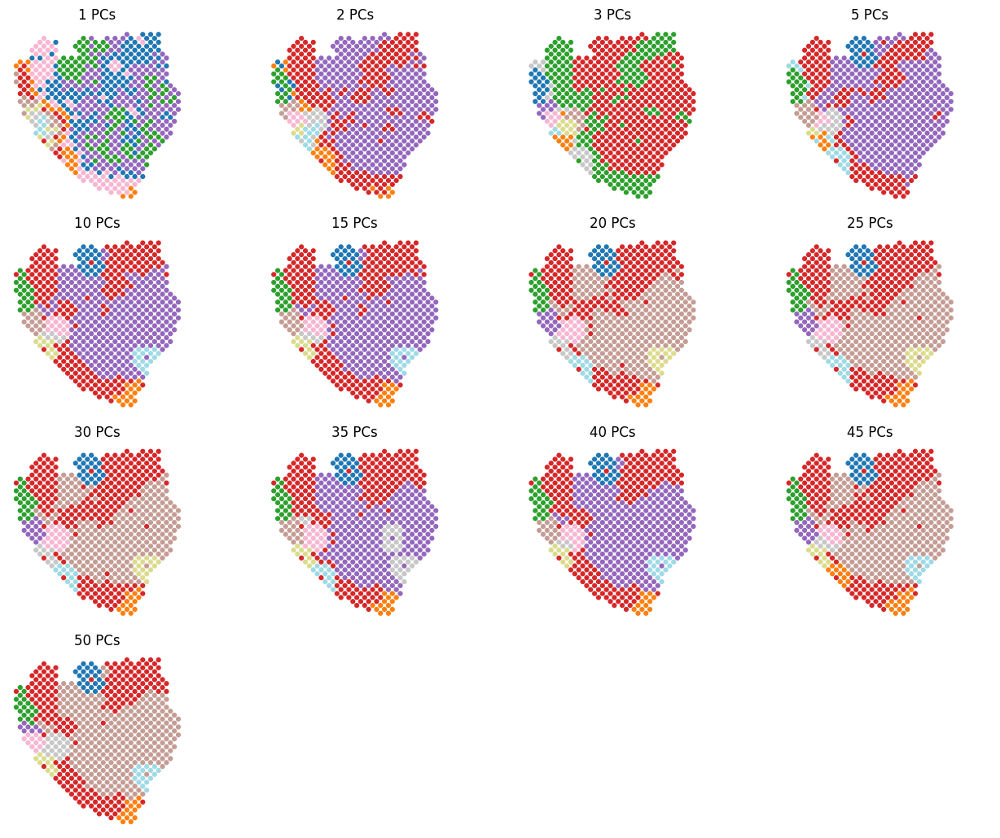

,n_pcs,cumulative_variance_percent
0,1,5.192159
1,2,8.593650
2,3,11.449439
3,5,16.713774
4,10,25.337130
5,15,31.393319
6,20,36.331528
7,25,40.598917
8,30,44.366575
9,35,47.746677


In [16]:
pc_sweep = plot_spacoex_pc_sweep([1, 2, 3, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50])

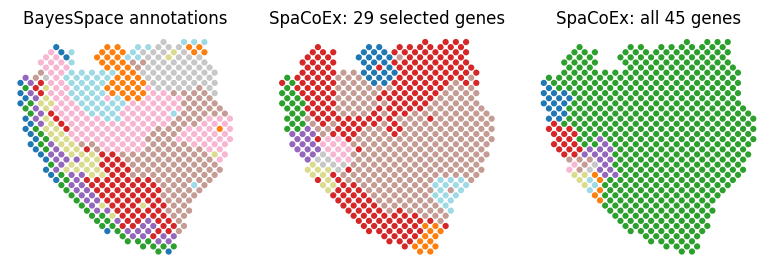

In [17]:
# ============================================================
# Spatial clustering comparison:
# BayesSpace vs SpaCoEx 29 genes vs SpaCoEx all 45 genes
# No legends / no colorbars
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

N_PCS_FOR_PLOT = 5   # use 5 to match the older joint notebook; change if needed

def spacoex_clusters_fixed_genes(genes, n_pcs=N_PCS_FOR_PLOT):
    ad = adata[:, genes].copy()
    X_use = dense(ad)

    coords = coords_from(ad)
    nbr = neighbor_idx(ad, N_NEIGHBORS)

    mats = local_corr(X_use, nbr)
    metric_mats = logeuclid_mats(mats, reg=RIDGE)
    F = logeuclid_features(metric_mats)

    Z = StandardScaler().fit_transform(F)

    n_components = min(n_pcs, Z.shape[0] - 1, Z.shape[1])

    scores = PCA(
        n_components=n_components,
        random_state=RANDOM_STATE
    ).fit_transform(Z)

    raw = KMeans(
        n_clusters=N_CLUSTERS,
        n_init=50,
        random_state=RANDOM_STATE
    ).fit_predict(scores)

    labels = relabel_by_position(raw, coords).astype(str)

    return ad, labels, scores


# Left: BayesSpace annotation
bayes_labels = adata.obs.loc[
    old_corr_only["adata"].obs_names,
    "cluster"
].astype(str).to_numpy()

# Middle: SpaCoEx using 29 selected genes
genes_29 = list(old_corr_only["selected_genes"])
ad_29 = old_corr_only["adata"].copy()
labels_29 = ad_29.obs["Old_CorrOnly_cluster"].astype(str).to_numpy()

# Right: SpaCoEx using all 45 genes directly, no gene selection
genes_45 = [g for g in GENES_45 if g in adata.var_names]
ad_45, labels_45, scores_45 = spacoex_clusters_fixed_genes(genes_45)

# Same coordinates for all three
coords = coords_from(ad_29)

plots = [
    ("BayesSpace annotations", bayes_labels),
    ("SpaCoEx: 29 selected genes", labels_29),
    ("SpaCoEx: all 45 genes", labels_45),
]

fig, axes = plt.subplots(1, 3, figsize=(8, 2.7))

for ax, (title, labels) in zip(axes, plots):
    codes = pd.Categorical(labels).codes

    ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=codes,
        cmap="tab20",
        s=20,
        linewidths=0
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(title)

plt.tight_layout()
plt.show()

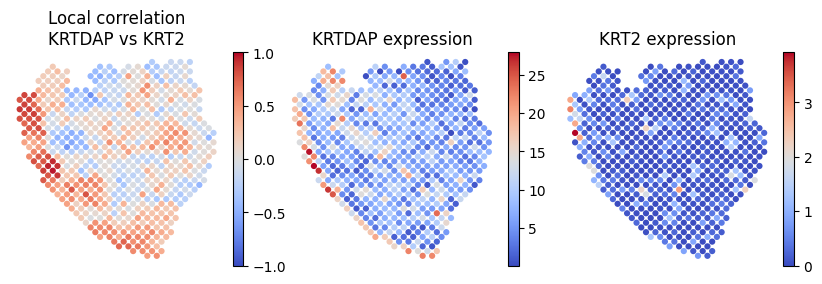

In [19]:
# KRTDAP-KRT2 local correlation and individual expression maps

import numpy as np
import matplotlib.pyplot as plt

GENE_1 = "KRTDAP"
GENE_2 = "KRT2"
FIGSIZE = (8, 2.6)
POINT_SIZE = 20

ad_pair = old_corr_only["adata"][:, [GENE_1, GENE_2]].copy()
X_pair = dense(ad_pair)
coords = coords_from(ad_pair)

neighbors = neighbor_idx(ad_pair, N_NEIGHBORS)
correlation_matrices = local_corr(X_pair, neighbors)
local_correlation = correlation_matrices[:, 0, 1]

plot_data = [
    (
        f"Local correlation\n{GENE_1} vs {GENE_2}",
        local_correlation,
        -1,
        1
    ),
    (
        f"{GENE_1} expression",
        X_pair[:, 0],
        None,
        None
    ),
    (
        f"{GENE_2} expression",
        X_pair[:, 1],
        None,
        None
    ),
]

fig, axes = plt.subplots(1, 3, figsize=FIGSIZE)

for ax, (title, values, vmin, vmax) in zip(axes, plot_data):
    scatter = ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=values,
        cmap="coolwarm",
        vmin=vmin,
        vmax=vmax,
        s=POINT_SIZE,
        linewidths=0
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(title)

    fig.colorbar(
        scatter,
        ax=ax,
        fraction=0.046,
        pad=0.04
    )

fig.subplots_adjust(
    left=0.01,
    right=0.99,
    bottom=0.02,
    top=0.84,
    wspace=0.18
)

plt.show()

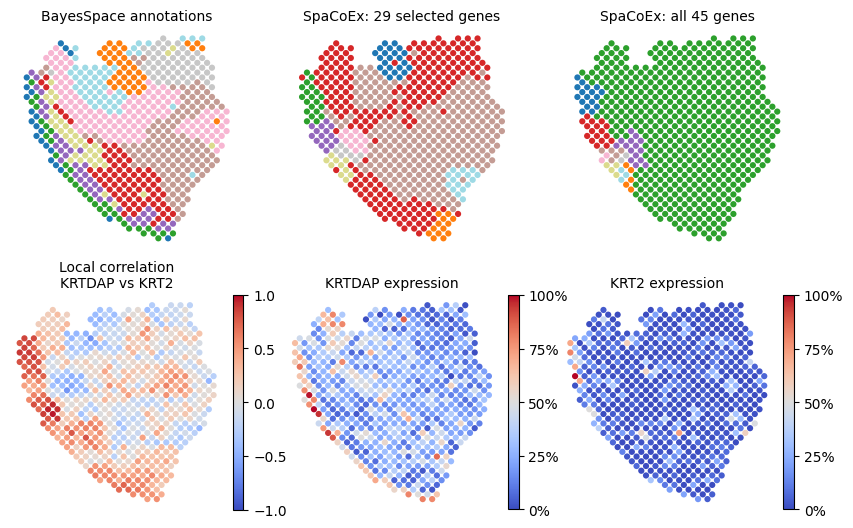

In [20]:
# ============================================================
# Combined 2 x 3 figure
#
# Top:
#   BayesSpace | SpaCoEx 29 genes | SpaCoEx 45 genes
#
# Bottom:
#   KRTDAP-KRT2 correlation | KRTDAP expression | KRT2 expression
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

N_PCS_FOR_PLOT = 5
POINT_SIZE = 20
FIGSIZE = (8, 5.2)


def spacoex_clusters_fixed_genes(genes, n_pcs=N_PCS_FOR_PLOT):
    ad = adata[:, genes].copy()
    X_use = dense(ad)

    coordinates = coords_from(ad)
    neighbors = neighbor_idx(ad, N_NEIGHBORS)

    matrices = local_corr(X_use, neighbors)
    metric_matrices = logeuclid_mats(matrices, reg=RIDGE)
    features = logeuclid_features(metric_matrices)
    standardized = StandardScaler().fit_transform(features)

    n_components = min(
        n_pcs,
        standardized.shape[0] - 1,
        standardized.shape[1]
    )

    scores = PCA(
        n_components=n_components,
        random_state=RANDOM_STATE
    ).fit_transform(standardized)

    raw_labels = KMeans(
        n_clusters=N_CLUSTERS,
        n_init=50,
        random_state=RANDOM_STATE
    ).fit_predict(scores)

    labels = relabel_by_position(
        raw_labels,
        coordinates
    ).astype(str)

    return ad, labels, scores


def percent_of_maximum(values):
    values = np.asarray(values, dtype=float)
    maximum = np.nanmax(values)

    if not np.isfinite(maximum) or maximum <= 0:
        return np.zeros_like(values)

    return 100 * values / maximum


# ------------------------------------------------------------
# Top row: clustering results
# ------------------------------------------------------------

ad_29 = old_corr_only["adata"].copy()
coords = coords_from(ad_29)

bayes_labels = (
    adata.obs
    .loc[ad_29.obs_names, "cluster"]
    .astype(str)
    .to_numpy()
)

labels_29 = (
    ad_29.obs["Old_CorrOnly_cluster"]
    .astype(str)
    .to_numpy()
)

genes_45 = [
    gene for gene in GENES_45
    if gene in adata.var_names
]

ad_45, labels_45, scores_45 = (
    spacoex_clusters_fixed_genes(genes_45)
)

cluster_plots = [
    ("BayesSpace annotations", bayes_labels),
    ("SpaCoEx: 29 selected genes", labels_29),
    ("SpaCoEx: all 45 genes", labels_45),
]


# ------------------------------------------------------------
# Bottom row: KRTDAP and KRT2
# ------------------------------------------------------------

GENE_1 = "KRTDAP"
GENE_2 = "KRT2"

ad_pair = ad_29[:, [GENE_1, GENE_2]].copy()
X_pair = dense(ad_pair)

pair_neighbors = neighbor_idx(
    ad_pair,
    N_NEIGHBORS
)

correlation_matrices = local_corr(
    X_pair,
    pair_neighbors
)

local_correlation = correlation_matrices[:, 0, 1]
gene_1_percent = percent_of_maximum(X_pair[:, 0])
gene_2_percent = percent_of_maximum(X_pair[:, 1])


# ------------------------------------------------------------
# Draw one combined figure
# ------------------------------------------------------------

fig, axes = plt.subplots(
    2,
    3,
    figsize=FIGSIZE
)

# Top row: no legends or colorbars
for ax, (title, labels) in zip(axes[0], cluster_plots):
    codes = pd.Categorical(labels).codes

    ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=codes,
        cmap="tab20",
        s=POINT_SIZE,
        linewidths=0
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(title, fontsize=10)


# Bottom-left: local correlation
scatter = axes[1, 0].scatter(
    coords[:, 1],
    coords[:, 0],
    c=local_correlation,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    s=POINT_SIZE,
    linewidths=0
)

axes[1, 0].invert_yaxis()
axes[1, 0].set_aspect("equal")
axes[1, 0].axis("off")
axes[1, 0].set_title(
    "Local correlation\nKRTDAP vs KRT2",
    fontsize=10
)

colorbar = fig.colorbar(
    scatter,
    ax=axes[1, 0],
    fraction=0.046,
    pad=0.04
)
# colorbar.set_label("Correlation", fontsize=8)


# Bottom-middle and bottom-right: relative expression
expression_plots = [
    ("KRTDAP expression", gene_1_percent),
    ("KRT2 expression", gene_2_percent),
]

for ax, (title, values) in zip(axes[1, 1:], expression_plots):
    scatter = ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=values,
        cmap="coolwarm",
        vmin=0,
        vmax=100,
        s=POINT_SIZE,
        linewidths=0
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(title, fontsize=10)

    colorbar = fig.colorbar(
        scatter,
        ax=ax,
        fraction=0.046,
        pad=0.04
    )
    colorbar.set_ticks([0, 25, 50, 75, 100])
    colorbar.set_ticklabels(["0%", "25%", "50%", "75%", "100%"])

fig.subplots_adjust(
    left=0.01,
    right=0.99,
    bottom=0.03,
    top=0.96,
    wspace=0.18,
    hspace=0.20
)

plt.show()

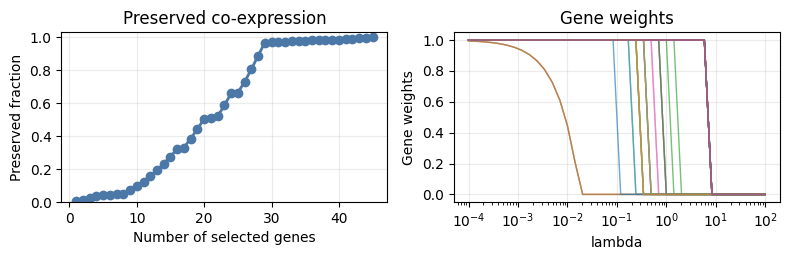

In [21]:
# ============================================================
# SpaCoEx: Preserved Fraction + Lasso-Style Gene Weight Path
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "old_corr_only" in globals():
    result = old_corr_only
elif "breast_corr_only" in globals():
    result = breast_corr_only
else:
    raise ValueError(
        "Could not find old_corr_only or breast_corr_only. "
        "Run SpaCoEx first."
    )

path = result["path"].copy()

nbr_idx = neighbor_idx(adata_g, N_NEIGHBORS)

mats = local_corr(X, nbr_idx)
metric_mats = logeuclid_mats(mats, reg=RIDGE)

S_raw = assoc_variation(metric_mats)
S_norm = S_raw / S_raw.sum()

gene_names_array = np.asarray(gene_names).astype(str)
lambda_values = np.logspace(-4, 2, 40)

weight_rows = []

for lam in lambda_values:
    weights = optimize_weights(
        S_norm,
        lam=float(lam),
        lr=LR,
        n_iter=N_ITER
    )

    for gene, weight in zip(gene_names_array, weights):
        weight_rows.append({
            "lambda": float(lam),
            "log10_lambda": np.log10(lam),
            "gene": gene,
            "weight": float(weight)
        })

weight_path_df = pd.DataFrame(weight_rows)

fig, axes = plt.subplots(
    1,
    2,
    figsize=(8, 2.7)
)

# Preserved co-expression
axes[0].plot(
    path["k"],
    path["preserved_fraction"],
    marker="o",
    linewidth=2,
    color="#4C78A8"
)

axes[0].set_xlabel("Number of selected genes")
axes[0].set_ylabel("Preserved fraction")
axes[0].set_title("Preserved co-expression")
axes[0].set_ylim(0, 1.03)
axes[0].grid(alpha=0.25)

# Gene-weight paths
for gene in gene_names_array:
    gene_path = weight_path_df[
        weight_path_df["gene"] == gene
    ]

    axes[1].plot(
        gene_path["lambda"],
        gene_path["weight"],
        linewidth=1,
        alpha=0.65
    )

axes[1].set_xscale("log")
axes[1].set_xlabel("lambda")
axes[1].set_ylabel("Gene weights")
axes[1].set_title("Gene weights")
axes[1].grid(alpha=0.25)

plt.tight_layout()
plt.show()

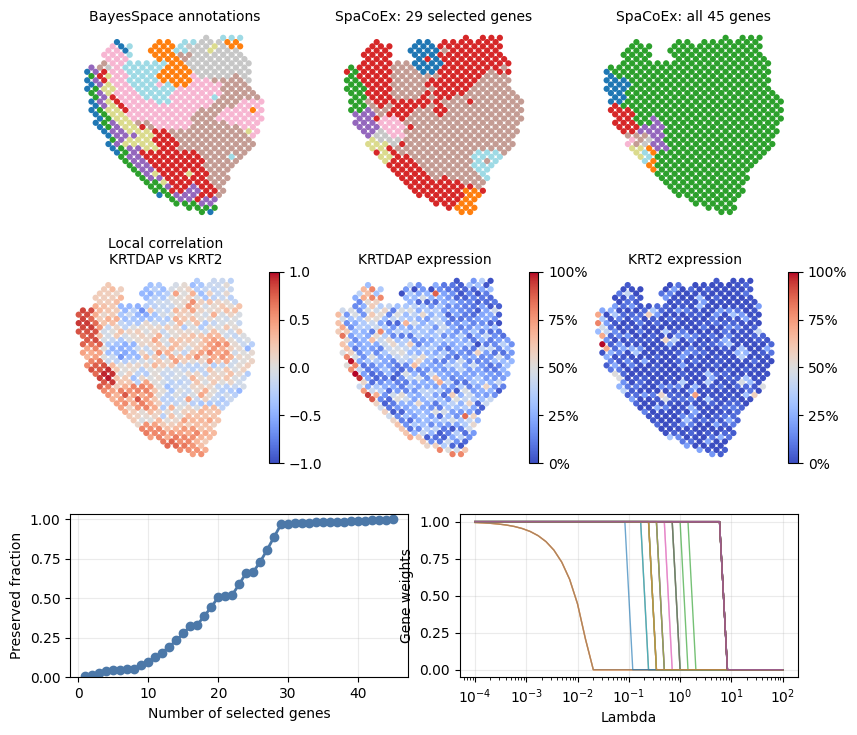

In [22]:
# ============================================================
# One combined figure
#
# Rows 1-2: original 2 x 3 spatial panels
# Row 3: preserved fraction and gene-weight paths
# ============================================================

fig = plt.figure(figsize=(8, 7.2))

grid = fig.add_gridspec(
    3,
    6,
    height_ratios=[1, 1, 0.85],
    hspace=0.28,
    wspace=0.65
)

# Original 2 x 3 spatial arrangement
cluster_axes = [
    fig.add_subplot(grid[0, 0:2]),
    fig.add_subplot(grid[0, 2:4]),
    fig.add_subplot(grid[0, 4:6]),
]

gene_axes = [
    fig.add_subplot(grid[1, 0:2]),
    fig.add_subplot(grid[1, 2:4]),
    fig.add_subplot(grid[1, 4:6]),
]

# Two gene-selection panels
preserved_ax = fig.add_subplot(grid[2, 0:3])
weights_ax = fig.add_subplot(grid[2, 3:6])


# ------------------------------------------------------------
# Row 1: clustering maps
# ------------------------------------------------------------

for ax, (title, labels) in zip(cluster_axes, cluster_plots):
    codes = pd.Categorical(labels).codes

    ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=codes,
        cmap="tab20",
        s=POINT_SIZE,
        linewidths=0
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(title, fontsize=10)


# ------------------------------------------------------------
# Row 2: local correlation
# ------------------------------------------------------------

scatter = gene_axes[0].scatter(
    coords[:, 1],
    coords[:, 0],
    c=local_correlation,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    s=POINT_SIZE,
    linewidths=0
)

gene_axes[0].invert_yaxis()
gene_axes[0].set_aspect("equal")
gene_axes[0].axis("off")
gene_axes[0].set_title(
    "Local correlation\nKRTDAP vs KRT2",
    fontsize=10
)

fig.colorbar(
    scatter,
    ax=gene_axes[0],
    fraction=0.046,
    pad=0.04
)


# ------------------------------------------------------------
# Row 2: relative expression
# ------------------------------------------------------------

expression_plots = [
    ("KRTDAP expression", gene_1_percent),
    ("KRT2 expression", gene_2_percent),
]

for ax, (title, values) in zip(
    gene_axes[1:],
    expression_plots
):
    scatter = ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=values,
        cmap="coolwarm",
        vmin=0,
        vmax=100,
        s=POINT_SIZE,
        linewidths=0
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(title, fontsize=10)

    colorbar = fig.colorbar(
        scatter,
        ax=ax,
        fraction=0.046,
        pad=0.04
    )

    colorbar.set_ticks([0, 25, 50, 75, 100])
    colorbar.set_ticklabels(
        ["0%", "25%", "50%", "75%", "100%"]
    )


# ------------------------------------------------------------
# Row 3: preserved co-expression
# No title
# ------------------------------------------------------------

preserved_ax.plot(
    path["k"],
    path["preserved_fraction"],
    marker="o",
    linewidth=2,
    color="#4C78A8"
)

preserved_ax.set_xlabel("Number of selected genes")
preserved_ax.set_ylabel("Preserved fraction")
preserved_ax.set_ylim(0, 1.03)
preserved_ax.grid(alpha=0.25)


# ------------------------------------------------------------
# Row 3: gene-weight paths
# No title; Lambda capitalized
# ------------------------------------------------------------

for gene in gene_names_array:
    gene_path = weight_path_df[
        weight_path_df["gene"] == gene
    ]

    weights_ax.plot(
        gene_path["lambda"],
        gene_path["weight"],
        linewidth=1,
        alpha=0.65
    )

weights_ax.set_xscale("log")
weights_ax.set_xlabel("Lambda")
weights_ax.set_ylabel("Gene weights")
weights_ax.grid(alpha=0.25)


fig.subplots_adjust(
    left=0.07,
    right=0.98,
    bottom=0.07,
    top=0.97
)


plt.show()

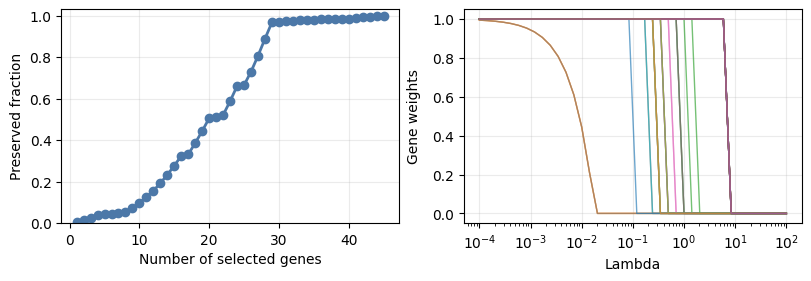

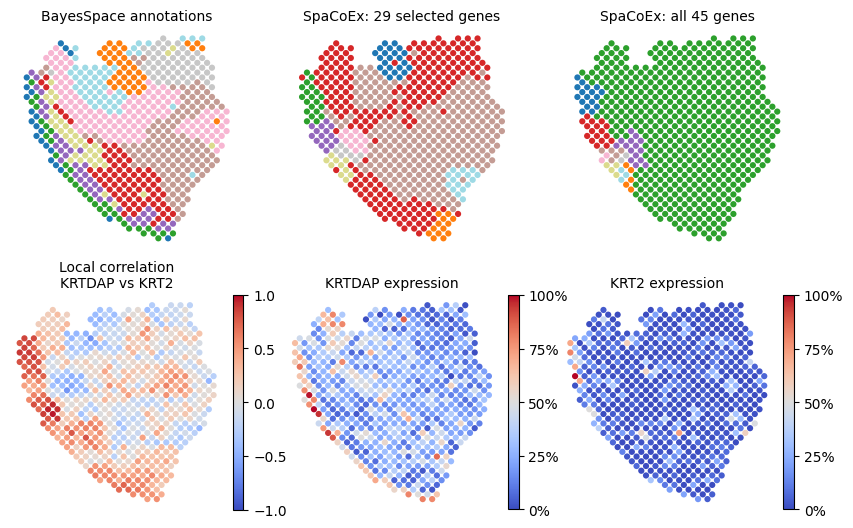

In [23]:
# ============================================================
# FIGURE 1:
# Preserved Fraction + Lasso-Style Gene Weight Path
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "old_corr_only" in globals():
    result = old_corr_only
elif "breast_corr_only" in globals():
    result = breast_corr_only
else:
    raise ValueError(
        "Could not find old_corr_only or breast_corr_only. "
        "Run SpaCoEx first."
    )

path = result["path"].copy()

nbr_idx = neighbor_idx(
    adata_g,
    N_NEIGHBORS
)

mats = local_corr(
    X,
    nbr_idx
)

metric_mats = logeuclid_mats(
    mats,
    reg=RIDGE
)

S_raw = assoc_variation(metric_mats)
S_norm = S_raw / S_raw.sum()

gene_names_array = np.asarray(
    gene_names
).astype(str)

lambda_values = np.logspace(
    -4,
    2,
    40
)

weight_rows = []

for lam in lambda_values:
    weights = optimize_weights(
        S_norm,
        lam=float(lam),
        lr=LR,
        n_iter=N_ITER
    )

    for gene, weight in zip(
        gene_names_array,
        weights
    ):
        weight_rows.append({
            "lambda": float(lam),
            "log10_lambda": np.log10(lam),
            "gene": gene,
            "weight": float(weight)
        })

weight_path_df = pd.DataFrame(
    weight_rows
)

# Constrained layout prevents the Gene weights label
# from overlapping the preserved-fraction panel.
fig, axes = plt.subplots(
    1,
    2,
    figsize=(8, 2.7),
    layout="constrained"
)

# Preserved co-expression
axes[0].plot(
    path["k"],
    path["preserved_fraction"],
    marker="o",
    linewidth=2,
    color="#4C78A8"
)

axes[0].set_xlabel(
    "Number of selected genes"
)
axes[0].set_ylabel(
    "Preserved fraction"
)
axes[0].set_ylim(
    0,
    1.03
)
axes[0].grid(
    alpha=0.25
)

# No title

# Gene-weight paths
for gene in gene_names_array:
    gene_path = weight_path_df[
        weight_path_df["gene"] == gene
    ]

    axes[1].plot(
        gene_path["lambda"],
        gene_path["weight"],
        linewidth=1,
        alpha=0.65
    )

axes[1].set_xscale("log")
axes[1].set_xlabel("Lambda")
axes[1].set_ylabel(
    "Gene weights",
    labelpad=8
)
axes[1].grid(alpha=0.25)

# No title

plt.show()


# ============================================================
# FIGURE 2:
# Combined 2 x 3 spatial figure
#
# Top:
# BayesSpace | SpaCoEx 29 genes | SpaCoEx 45 genes
#
# Bottom:
# KRTDAP-KRT2 correlation | KRTDAP expression | KRT2 expression
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

N_PCS_FOR_PLOT = 5
POINT_SIZE = 20
FIGSIZE = (8, 5.2)


def spacoex_clusters_fixed_genes(
    genes,
    n_pcs=N_PCS_FOR_PLOT
):
    ad = adata[:, genes].copy()
    X_use = dense(ad)

    coordinates = coords_from(ad)
    neighbors = neighbor_idx(
        ad,
        N_NEIGHBORS
    )

    matrices = local_corr(
        X_use,
        neighbors
    )

    metric_matrices = logeuclid_mats(
        matrices,
        reg=RIDGE
    )

    features = logeuclid_features(
        metric_matrices
    )

    standardized = (
        StandardScaler()
        .fit_transform(features)
    )

    n_components = min(
        n_pcs,
        standardized.shape[0] - 1,
        standardized.shape[1]
    )

    scores = PCA(
        n_components=n_components,
        random_state=RANDOM_STATE
    ).fit_transform(
        standardized
    )

    raw_labels = KMeans(
        n_clusters=N_CLUSTERS,
        n_init=50,
        random_state=RANDOM_STATE
    ).fit_predict(scores)

    labels = relabel_by_position(
        raw_labels,
        coordinates
    ).astype(str)

    return ad, labels, scores


def percent_of_maximum(values):
    values = np.asarray(
        values,
        dtype=float
    )

    maximum = np.nanmax(values)

    if (
        not np.isfinite(maximum)
        or maximum <= 0
    ):
        return np.zeros_like(values)

    return 100 * values / maximum


# ------------------------------------------------------------
# Top row: clustering results
# ------------------------------------------------------------

ad_29 = old_corr_only["adata"].copy()
coords = coords_from(ad_29)

bayes_labels = (
    adata.obs
    .loc[ad_29.obs_names, "cluster"]
    .astype(str)
    .to_numpy()
)

labels_29 = (
    ad_29.obs["Old_CorrOnly_cluster"]
    .astype(str)
    .to_numpy()
)

genes_45 = [
    gene
    for gene in GENES_45
    if gene in adata.var_names
]

ad_45, labels_45, scores_45 = (
    spacoex_clusters_fixed_genes(
        genes_45
    )
)

cluster_plots = [
    (
        "BayesSpace annotations",
        bayes_labels
    ),
    (
        "SpaCoEx: 29 selected genes",
        labels_29
    ),
    (
        "SpaCoEx: all 45 genes",
        labels_45
    ),
]


# ------------------------------------------------------------
# Bottom row: KRTDAP and KRT2
# ------------------------------------------------------------

GENE_1 = "KRTDAP"
GENE_2 = "KRT2"

ad_pair = ad_29[
    :,
    [GENE_1, GENE_2]
].copy()

X_pair = dense(ad_pair)

pair_neighbors = neighbor_idx(
    ad_pair,
    N_NEIGHBORS
)

correlation_matrices = local_corr(
    X_pair,
    pair_neighbors
)

local_correlation = (
    correlation_matrices[:, 0, 1]
)

gene_1_percent = percent_of_maximum(
    X_pair[:, 0]
)

gene_2_percent = percent_of_maximum(
    X_pair[:, 1]
)


# ------------------------------------------------------------
# Draw the 2 x 3 spatial figure
# ------------------------------------------------------------

fig, axes = plt.subplots(
    2,
    3,
    figsize=FIGSIZE
)

# Top row
for ax, (title, labels) in zip(
    axes[0],
    cluster_plots
):
    codes = pd.Categorical(
        labels
    ).codes

    ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=codes,
        cmap="tab20",
        s=POINT_SIZE,
        linewidths=0
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(
        title,
        fontsize=10
    )


# Bottom-left: local correlation
scatter = axes[1, 0].scatter(
    coords[:, 1],
    coords[:, 0],
    c=local_correlation,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    s=POINT_SIZE,
    linewidths=0
)

axes[1, 0].invert_yaxis()
axes[1, 0].set_aspect("equal")
axes[1, 0].axis("off")
axes[1, 0].set_title(
    "Local correlation\nKRTDAP vs KRT2",
    fontsize=10
)

fig.colorbar(
    scatter,
    ax=axes[1, 0],
    fraction=0.046,
    pad=0.04
)


# Bottom-middle and bottom-right
expression_plots = [
    (
        "KRTDAP expression",
        gene_1_percent
    ),
    (
        "KRT2 expression",
        gene_2_percent
    ),
]

for ax, (title, values) in zip(
    axes[1, 1:],
    expression_plots
):
    scatter = ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=values,
        cmap="coolwarm",
        vmin=0,
        vmax=100,
        s=POINT_SIZE,
        linewidths=0
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(
        title,
        fontsize=10
    )

    colorbar = fig.colorbar(
        scatter,
        ax=ax,
        fraction=0.046,
        pad=0.04
    )

    colorbar.set_ticks([
        0,
        25,
        50,
        75,
        100
    ])

    colorbar.set_ticklabels([
        "0%",
        "25%",
        "50%",
        "75%",
        "100%"
    ])

fig.subplots_adjust(
    left=0.01,
    right=0.99,
    bottom=0.03,
    top=0.96,
    wspace=0.18,
    hspace=0.20
)

plt.show()

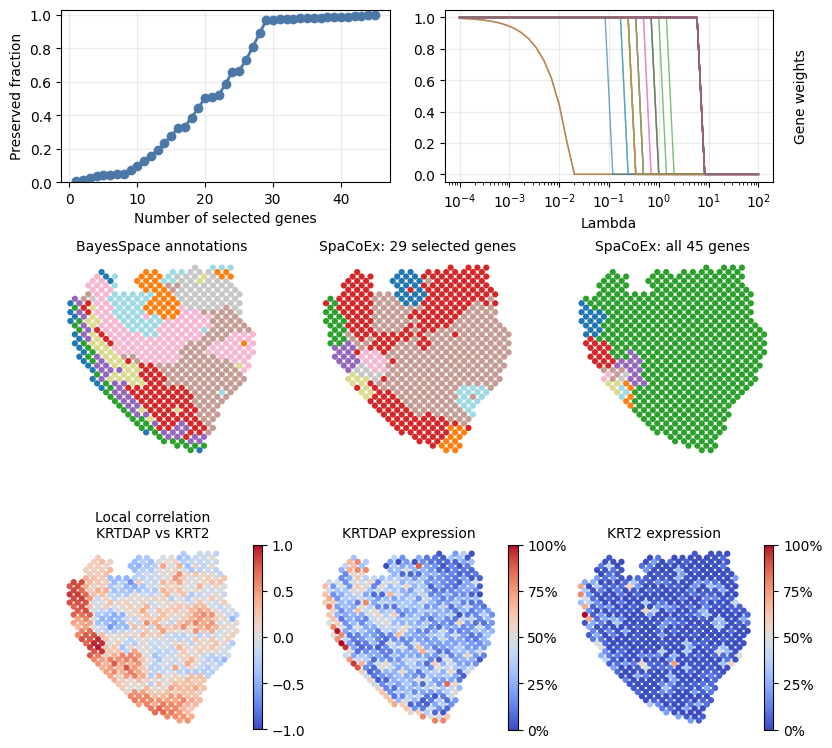

In [24]:
# ============================================================
# ONE IMAGE — SAME SIZES AS THE WORKING REVERSE-ORDER VERSION
#
# Row 1: preserved fraction | gene weights
# Row 2: BayesSpace | SpaCoEx 29 | SpaCoEx 45
# Row 3: correlation | KRTDAP | KRT2
# ============================================================

fig = plt.figure(figsize=(8, 8.1))

grid = fig.add_gridspec(
    3,
    6,
    height_ratios=[0.85, 1, 1],
    hspace=0.39,
    wspace=0.75
)

# Row 1: selection panels
preserved_ax = fig.add_subplot(
    grid[0, 0:3]
)

weights_ax = fig.add_subplot(
    grid[0, 3:6]
)

# Row 2: clustering panels
cluster_axes = [
    fig.add_subplot(grid[1, 0:2]),
    fig.add_subplot(grid[1, 2:4]),
    fig.add_subplot(grid[1, 4:6]),
]

# Row 3: gene-level panels
gene_axes = [
    fig.add_subplot(grid[2, 0:2]),
    fig.add_subplot(grid[2, 2:4]),
    fig.add_subplot(grid[2, 4:6]),
]


# ------------------------------------------------------------
# Row 1, left: preserved fraction
# ------------------------------------------------------------

preserved_ax.plot(
    path["k"],
    path["preserved_fraction"],
    marker="o",
    linewidth=2,
    color="#4C78A8"
)

preserved_ax.set_xlabel(
    "Number of selected genes"
)
preserved_ax.set_ylabel(
    "Preserved fraction"
)
preserved_ax.set_ylim(0, 1.03)
preserved_ax.grid(alpha=0.25)


# ------------------------------------------------------------
# Row 1, right: gene weights
# ------------------------------------------------------------

for gene in gene_names_array:
    gene_path = weight_path_df[
        weight_path_df["gene"] == gene
    ]

    weights_ax.plot(
        gene_path["lambda"],
        gene_path["weight"],
        linewidth=1,
        alpha=0.65
    )

weights_ax.set_xscale("log")
weights_ax.set_xlabel("Lambda")

# Put this label on the right to prevent overlap
weights_ax.set_ylabel(
    "Gene weights",
    rotation=90,
    labelpad=15
)
weights_ax.yaxis.set_label_position("right")

weights_ax.grid(alpha=0.25)


# ------------------------------------------------------------
# Row 2: clustering maps
# ------------------------------------------------------------

for ax, (title, labels) in zip(
    cluster_axes,
    cluster_plots
):
    codes = pd.Categorical(labels).codes

    ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=codes,
        cmap="tab20",
        s=POINT_SIZE,
        linewidths=0
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(
        title,
        fontsize=10
    )


# ------------------------------------------------------------
# Row 3, left: local correlation
# ------------------------------------------------------------

scatter = gene_axes[0].scatter(
    coords[:, 1],
    coords[:, 0],
    c=local_correlation,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    s=POINT_SIZE,
    linewidths=0
)

gene_axes[0].invert_yaxis()
gene_axes[0].set_aspect("equal")
gene_axes[0].axis("off")
gene_axes[0].set_title(
    "Local correlation\nKRTDAP vs KRT2",
    fontsize=10
)

fig.colorbar(
    scatter,
    ax=gene_axes[0],
    fraction=0.046,
    pad=0.04
)


# ------------------------------------------------------------
# Row 3: relative expression
# ------------------------------------------------------------

expression_plots = [
    (
        "KRTDAP expression",
        gene_1_percent
    ),
    (
        "KRT2 expression",
        gene_2_percent
    ),
]

for ax, (title, values) in zip(
    gene_axes[1:],
    expression_plots
):
    scatter = ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=values,
        cmap="coolwarm",
        vmin=0,
        vmax=100,
        s=POINT_SIZE,
        linewidths=0
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(
        title,
        fontsize=10
    )

    colorbar = fig.colorbar(
        scatter,
        ax=ax,
        fraction=0.046,
        pad=0.04
    )

    colorbar.set_ticks([
        0,
        25,
        50,
        75,
        100
    ])

    colorbar.set_ticklabels([
        "0%",
        "25%",
        "50%",
        "75%",
        "100%"
    ])

fig.subplots_adjust(
    left=0.07,
    right=0.96,
    bottom=0.07,
    top=0.97
)

plt.show()